<br>

**<font size="5">Table of contents</font>** 

 - [**Chapter 0: Introduction**](#Chapter0)
     - [**0.1 Statistical methods**](#0.1)
     - [**0.2 Data and portfolio construction**](#0.2)
 - [**Chapter 1: Data and portfolio construction**](#Chapter1)
    - [**1.1 High Minus Low (HML) portfolio**](#1.1)
    - [**1.2 Winners Minus Losers (WML) portfolio**](#1.2)
    - [**1.3 Value Momemtum (HML-WML) Portfolio**](#1.3) 
    - [**1.4 Market Portfolio (Mkt-RF) portfolio**](#1.4)
 - [**Chapter 2:  Risk- risk reward ratio's and Data exploration**](#Chapter2)
    - [**2.1 Return and risk reward ratio's**](#2.1)
    - [**2.2 Exploratory Data Analysis (EDA)**](#2.2)
 - [**Chapter 3: Simulation analysis Part 1**](#Chapter3)
    - [**3.1 Mkt-RF**](#3.1)
    - [**3.2 HML**](#3.2)
    - [**3.3 WML**](#3.3)
    - [**3.4 HML-WML**](#3.4)
    - [**3.5 Summarize Results**](#3.5)
 - [**Chapter 4:  Simulation analysis Part 2**](#Chapter4)
    - [**4.1.Simulation Period: 01-01-1963 till 31-12-2003**](#4.1)
        - [**4.1.1 Mkt-RF**](#4.1.1)
        - [**4.1.2 HML**](#4.1.2)
        - [**4.1.3 WML**](#4.1.3)
        - [**4.1.4 HML-WML**](#4.1.4)
    - [**4.2.Simulation Period: 01-01-1927 till 31-12-2003**](#4.2)
        - [**4.2.1 Mkt-RF**](#4.2.1)
        - [**4.2.2 HML**](#4.2.2)
        - [**4.2.3 WML**](#4.2.3)
        - [**4.2.4 HML-WML**](#4.2.4)
    - [**4.3 Summarize Results**](#4.3)
        - [**4.3.1 Simulation Period: 01-01-1963 till 31-12-2003**](#4.3.1)
        - [**4.3.2 Simulation Period: 01-01-1927 till 31-12-2003**](#4.3.2)
 - [**Chapter 5:  Conclusion and discussion**](#Chapter5)
 - [**Chapter 6:  Limitations**](#Chapter6)
 - [**Chapter 7: Questions**](#Chapter7)
 - [**Chapter 8: References**](#Chapter8)


<a id='Chapter0'></a>
# Chapter 0: Introduction

## Goal
 

The goal of this notebook is to twofold: 

 1. Try to have a better understanding about the return risk-profile of the **value (HML) factor, momentum (WML) factor and a combined portfolio of value and momentum (HML-WML) under several investment horizons** . I include the **market factor (Mkt-RF)** as a sort of benchmark. For now, I've focused on **geometric return (annualized) and maximum drawdown**. In case of **maximum drawdown**, I am concerned whether it make sense to bootstrap this statistic, since this an extremum  statistic. I have seen paper bootstrapping this statistic (e.g.[**[1]**](https://papers.ssrn.com/sol3/papers.cfm?abstract_id=3331680)).

2. Try to answer whether recent performance of value and momentum is in line with historical performance. Several people have noticed that most factors did not deliver much return in the last 15 years. Are the value and momentum broken or just experiencing a period of bad luck? 

## Statistical methods <a id='0.1'></a>
To answer these question I use different simulation assumptions about the behavior of factor returns:


 - **Simulation under normality** approximates factor returns by normal distributions
that I calibrate using the sample means and standard deviations from the full
sample.


- **The independent bootstrap** 
Resamples each factor’s return independently with replacement (i.e., allowing observations to
be chosen multiple times) from every other factor. This bootstrap scheme
preserves the empirical distributions of factor returns that is, it accounts for
deviations from normality, but does not account for serial correlations in factor returns.


- **Block bootstrap**: The independent bootstrap requires that the data being bootstrapped is independent and identically distributed (iid). This does not work well for time series, where serial correlation is present. One approach that addresses this limitation is block bootstrapping. There are several versions of the block bootstrap, I will look at the:  
<br> 
    - **Circular block bootstrap (CBB)**: This bootstrap method is an improvement on the **moving block bootstrap (MBB)**. The MBB randomly draws fixed size blocks from the data and cut and pastes them to form a new series the same size as the original data. However, it has a major limitation in that beginning and ending points are systematically underrepresented. To address this limitation an extension to this method was developed called the Circular Block Bootstrap (CBB). This approach is much the same except that it wraps around the beginning and ending points to ensure they are drawn with similar probability as the other blocks To address this limitation an extension to this method was developed called the Circular Block Bootstrap (CBB). This approach is much the same except that it wraps around the beginning and ending points to ensure they are drawn with similar probability as the other blocks. 
<br>

    - **Stationary bootstrap (SB)**: One limitation of the circular block bootstrap is the fixed block size. Different block sizes emphasize different periods or lengths of autocorrelation (memory). At the extremes you can take a block size so small that no serial correlation is captured, and at the other end you could take a block size so large that you end up sampling the original series. To address the fixed block sizes, the Stationary Bootstrap (SB) randomly samples blocks from a geometric distribution with mean $k$. The advantage of this approach is that the circular block bootstrap doesn't quite give us a stationary time series (The distribution of $R_{k-1:k}$ is not the same as the distribution of $R_{k:k+1}$). Averaging over the random choices of block lengths overcomes this problem.

I found an excellent implementation of these methods from the [**ARCH package [13]**](https://arch.readthedocs.io/en/latest/bootstrap/timeseries-bootstraps.html). 

**Bootstrap implementation**

When bootstrapping the simulated paths for different investment horizons, I use the total length of the observed path to sample from. As a result, I obtain a  matrix where each column is a simulated path. Similar as **[Fama and French [2]](https://academic.oup.com/raps/article-abstract/8/2/232/4810768)** I then calibrate the number of rows of this matrix depending on the investment horizon.


## Data and portfolio construction <a id='0.2'></a>

I will be using daily returns (possible to change to monthy) obtained from [**Kenneth French's data library [8]**](http://mba.tuck.dartmouth.edu/pages/faculty/ken.french/data_library.html) for the US stock market (NYSE, AMEX, and NASDAQ) over the period  03/01/1927 to 28/02/2019. The data can be sourced directly from their website using [**Pandas datareader [14]**](https://pandas-datareader.readthedocs.io/en/latest/remote_data.html). Note thate the Fama-French returns are simple raw returns (not log returns).

**As a reminder:**

 - A **value strategy** favors high fundamentals-to-price ratios by going long these stocks, while selling short those stocks
that have lower fundamentals-to-price ratios.
 - On the other hand, a **momentum strategy** exploits the phenomenon that securities which have performed well relative
to peers (winners) on average continue to outperform, and securities that have performed relatively poorly (losers) tend to
continue to under-perform.

**Long-Short Portfolio Construction:**

There are different ways to construct long-short value and momentum portfolio's. For now I will construct the portfolio's as Fama and French did in their 2012 [**paper [3]**](https://www.sciencedirect.com/science/article/pii/S0304405X12000931):

  -  **Value Portfolio (HML):** is formed by first splitting the universe of stocks into two size categories: `Small (S)  and Big (B)` using NYSE market cap medians and then splitting stocks `into three groups based on book-to-market equity highest 30% (H), middle 40% (M), and lowest 30% (L)`, using NYSE breakpoints. The intersection of stocks across the six categories are value-weighed and used to form the portfolios SH (small, high $\frac{BE}{ME}$), SM (small, middle $\frac{BE}{ME}$), SL (small, low $\frac{BE}{ME}$), BH (big, high $\frac{BE}{ME}$), BM (big, middle $\frac{BE}{ME}$), and BL (big, low $\frac{BE}{ME}$). HML is the average of the two high book-to-market portfolios minus the average of the two low book-to-market portfolios. 

\begin{equation} \text{HML} =	\frac{1}{2}\times  (\text{Small High Value} + \text{Big High Value})
 - \frac{1}{2}\times (\text{Small Low Value} + \text{Big Low Value})\end{equation}

 - **Momentum portfolio (WML):** is constructed similarly to HML in which six value-weight portfolios formed on size and prior (2-12) returns to construct momentum. Specifically, prior (2-12) returns is defined as the past 12-month return, skipping the most recent months return to avoid micro-structure and liquidity biases and now generally used as the standard definition of momentum. The portfolios, which are formed daily, are the `intersections of 2 portfolios formed on size (market equity, ME) and 3 portfolios formed on prior (2-12) return`. The daily size breakpoint is the median NYSE market equity. The daily prior (2-12) return breakpoints are the 30th and 70th NYSE percentiles. Momentum is the average return on the two high prior return portfolios (Winners) minus the average return on the two low prior return portfolios (Losers)

\begin{equation} \text{WML} =	\frac{1}{2}\times  (\text{Small Winners} + \text{Big Winners})
 - \frac{1}{2}\times (\text{Small Losers} + \text{Big Losers})\end{equation}


 - **Value-Momentum portfolio (HML-WML)**: is a `50-50 weighting` of the value and momentum strategy.
 

 -  **Market portfolio (Mkt-RF):** represents the equity market risk premium, or aggregate equity return minus the risk free
rate. It is the return from simply being long equities at market capitalization weights and, unlike other factors, is not a
spread return between

Other common implementations of value and momentum are based on deciles and quintiles. For example, Moskowitz and Daniel [[4](https://www.sciencedirect.com/science/article/pii/S0304405X16301490)] construct their momentum portfolios based on deciles where the winner portfolio is decile 1 and the loser portfolio decile 10. Formally, this can be represented as follow:

\begin{equation} \text{WML (Dec.)} =	\frac{1}{2}\times\text{Winners (D1)}
 - \frac{1}{2}\times \text{Losers (D10)}\end{equation}

If I have time left, I will take a closer look at the influence of portfolio construction based on `deciles and quintiles` (I did had very quick look  at the implementation based on deciles, when verifying results of Kent and Moskowitz, and noticed that  the implementation based on `deciles` earns a substantial higher premium, but also much higher drawdowns)

What follows is some of my initial experimentation with these simulation approaches along with some caveats. The analysis is organized as follow: I start with construction the portfolios in [**Chapter 1**](#Chapter1). Next, I introduce some common performance statistics and perform some exploratory data analysis in [**Chapter 2**](#Chatper2). In [**Chapter 3**](#Chapter3), I start with part 1 of the simulation analysis where I try to gain a better understanding of the risk-return profile for the portfolios under different investment horizons. Subsequently, in [**Chapter 4**](#Chapter4), I look at the recent past performance of these portfolios and examine whether this is in line with historical performance. Finally, in [**Chapter 5**](#Chapter5) and [**Chapter 6**](#Chapter6) , I summarize my conclusions and discusses limitations of the study. 

**I have stated my questions regarding the analysis in** [**Chapter 7**](#Chapter7). 


At the top of each chapter I have declared which functions are being used. To keep the notebook as well-organized as possible, I have decided to put these functions into a separate file named `simulation_lib` . Furthermore, note that I use strategies, portfolios, factors interchangeably throughout the analysis. They all have the same interpretation. 

**<font size="5">Import libraries</font>**

In [1]:
from pathlib import Path

import datetime
import os 
import warnings
warnings.filterwarnings("ignore")
#os.chdir("C:\\Users\Pieter-Jan\Documents\Factor_Crashes\Poster")

# scientific libraries
import pandas as pd
import numpy as np
import scipy.stats as stats
from scipy.stats.mstats import gmean
import statsmodels.api as sm
from pandas_datareader.famafrench import get_available_datasets
import pandas_datareader.data as web
from random import randint
#import numba as nb
#from numba import jit
#from numba import jitclass


# plot libraries
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.gridspec as gridspec
import seaborn as sns
#import brewer2mpl
from statsmodels.graphics.tsaplots import plot_pacf
from matplotlib.ticker import FormatStrFormatter

# imports file with all custum functions
from importlib import reload 
import simulation_lib
reload(simulation_lib)
# instead of listing all individual functions, we chose here to load everything
# Make sure to use unique function names, though, or you might overrule built-in functions
from simulation_lib import *

# plot parameters
sns_params = {
    'font.family':'serif',
    'font.size': 12,
    'font.weight': 'medium',
    'figure.figsize': (10, 7),
}
plt.style.use('seaborn-talk')
plt.style.use('bmh')
sns.set_context(sns_params)
savefig_kwds = dict(dpi=300, bbox_inches='tight', frameon=True, format='png')
set2=['#348ABD', '#A60628', '#7A68A6', '#467821', '#D55E00', '#CC79A7', '#56B4E9']
#plt.style.available
#sns.set(style='darkgrid', context='talk')
%matplotlib inline

<a id='Chapter1'></a>
# Chapter 1: Data and portfolio construction

I start with constructing the four portfolios:
 - The market portfolio (Mkt-RF)
 - The value portfolio (HML)
 - The momentum portfolio (WML)
 - A 50-50 weighted value-momentum portfolio (HML-WML)
 
I will implement the long-short portfolio myself using the raw portfolio sorts to walk through implementation process. Alternatively, you could directly take the long short portfolio constructed by Fama and French. To verify whether my portfolio implementation is correct, I compare my portfolio construction with Fama and French's implementation. Ideally, I should get the exact same results. This is only applicable for the HML and WML portfolio. For the market portfolio there is no sorting involved since this is just a value weighted portfolio of all stocks ((NYSE, AMEX, and NASDAQ)) minus the risk free. Finally, for the HML-WML portfolio, I choose arbitrarily a 50-50 weighting.

### Helper function
 - `cumsum_plot:` plots the cumulative return 

### Global parameters
Global parameters are defined in CAPITAL LETTERS. This makes it is easy to quickly change from daily data to monthly and some other parameters.

In [2]:
# data frequency, easy to change between month and daily data
FREQUENCY = 252    # assuming 252 trading days in a year
N_PATHS = 10_000  # nr ob paths (bootstraps)
BLOCKSIZE = 126  # blocksize, for the stationary bootstrap this is the mean of the geometric distribution
IH = [1, 3, 5, 10, 20, 30]  # investment horizon in years
START_YEAR = 1927  # start year when sourcing the portfolios from FAMA AND FRENCH
PLOT_INTERMEDIATE = False  # plots intermediate histograms when calling the simulation methods

# Portfolio names from FAMA AND FRENCH ; to switch to monthly just remove '_daily'
VALUE = '6_Portfolios_2x3_daily'
CHECK_VALUE = 'F-F_Research_Data_Factors_daily'
MOMENTUM = '6_Portfolios_ME_Prior_12_2_daily'
CHECK_MOMENTUM = 'F-F_Momentum_Factor_daily'

In [3]:
# get a look at all the available portfolios
print(len(get_available_datasets()))
get_available_datasets()[:5]

286


['F-F_Research_Data_Factors',
 'F-F_Research_Data_Factors_weekly',
 'F-F_Research_Data_Factors_daily',
 'F-F_Research_Data_5_Factors_2x3',
 'F-F_Research_Data_5_Factors_2x3_daily']

## High Minus Low (HML) portfolio <a id='1.1'></a>

In [4]:
# load the data for the value factor
dic_HML = web.DataReader(VALUE, 'famafrench', start=START_YEAR)
print(dic_HML['DESCR'])

6 Portfolios 2x3 daily
----------------------

This file was created by CMPT_ME_BEME_RETS_DAILY using the 201902 CRSP database. It contains value-weighted returns for the intersections of 2 ME portfolios and 3 BE/ME portfolios. The portfolios are constructed at the end of June. ME is market cap at the end of June. BE/ME is book equity at the last fiscal year end of the prior calendar year divided by ME at the end of December of the prior year. Missing data are indicated by -99.99 or -999. The break points use Compustat firms plus the firms hand-collected from the Moodys Industrial, Transportation, Utilities, and Financials Manuals. The portfolios use Compustat firms plus the firms hand-collected from the Moodys Industrial, Transportation, Utilities, and Financials Manuals. Copyright 2019 Kenneth R. French

  0 : Average Value Weighted Returns -- Daily (24281 rows x 6 cols)
  1 : Average Equal Weighted Returns -- Daily (24281 rows x 6 cols)
  2 : Number of Firms in Portfolios (24281 row

            SMALL LoBM  ME1 BM2  SMALL HiBM  BIG LoBM  ME2 BM2  BIG HiBM
Date                                                                    
1927-01-03       -0.42    -1.00       -0.49     -1.07    -0.58     -0.83
1927-01-04        0.98     0.50       -0.08      0.55     0.16      0.25
1927-01-05        0.95     0.25        0.49      0.31    -0.07      0.15
1927-01-06       -0.11    -0.14       -0.18     -0.21    -0.24      0.01


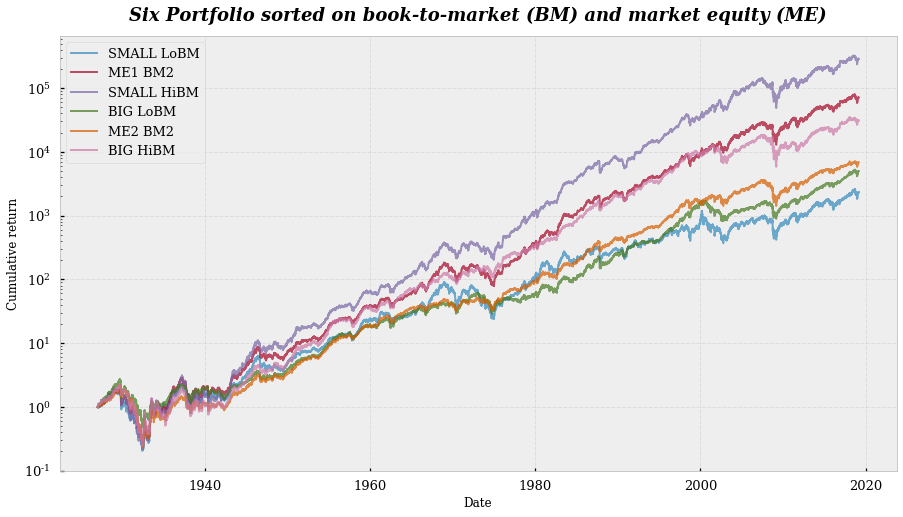

In [5]:
df_HML = dic_HML[0]
df_HML.index = df_HML.index.astype('datetime64[ns]')
print(df_HML.head(n=4))
cumsum_plot(
    df_HML,
    title="Six Portfolio sorted on book-to-market (BM) and market equity (ME)")

### Construct HLM long short portfolio

In [6]:
# long short value portfolio
longs, shorts = ['SMALL HiBM', 'BIG HiBM'], ['SMALL LoBM', 'BIG LoBM']
HML_LS = pd.DataFrame(df_HML.loc[:, longs].sum(axis=1) / 2 -
                      df_HML.loc[:, shorts].sum(axis=1) / 2,
                      columns=['HML_VW'])  # value weighted HML

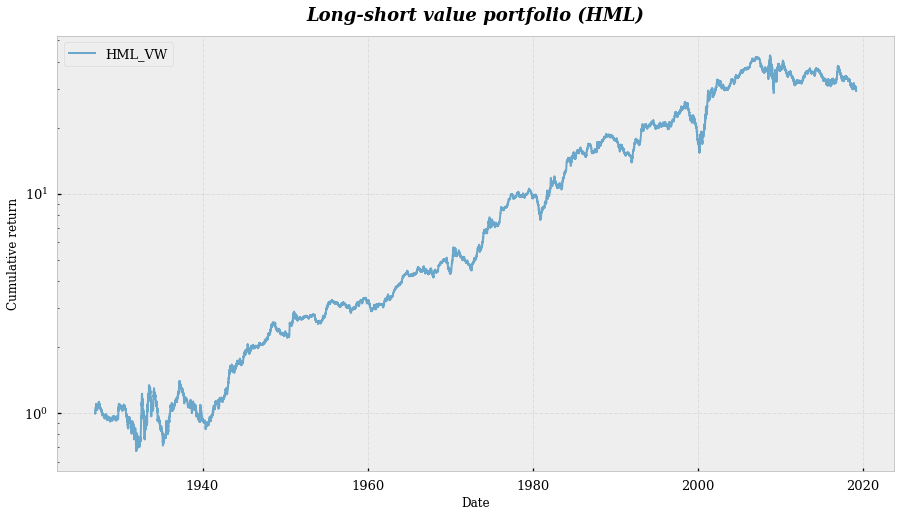

,HML_VW
Date,
1927-01-03,0.085
1927-01-04,-0.680
1927-01-05,-0.310
1927-01-06,0.075
1927-01-07,0.440


In [7]:
cumsum_plot(HML_LS, title="Long-short value portfolio (HML)")
HML_LS.head(n=5)

### Compare both HML long short portfolios
If my construction method is correct, we should get exact same results.

In [8]:
dict_HML_check = web.DataReader(CHECK_VALUE, 'famafrench', start=START_YEAR)

In [9]:
print(dict_HML_check['DESCR'])
HML_check = dict_HML_check[0]
HML_check.index = HML_check.index.astype('datetime64[ns]')
HML_check.head(n=5)

F-F Research Data Factors daily
-------------------------------

This file was created by CMPT_ME_BEME_RETS_DAILY using the 201902 CRSP database. The Tbill return is the simple daily rate that, over the number of trading days in the month, compounds to 1-month TBill rate from Ibbotson and Associates Inc. Copyright 2019 Kenneth R. French

  0 : (24281 rows x 4 cols)


,Mkt-RF,SMB,HML,RF
Date,,,,
1927-01-03,-0.79,0.19,0.09,0.01
1927-01-04,0.31,0.15,-0.67,0.01
1927-01-05,0.14,0.43,-0.31,0.01
1927-01-06,-0.17,0.00,0.07,0.01
1927-01-07,0.30,-0.25,0.44,0.01


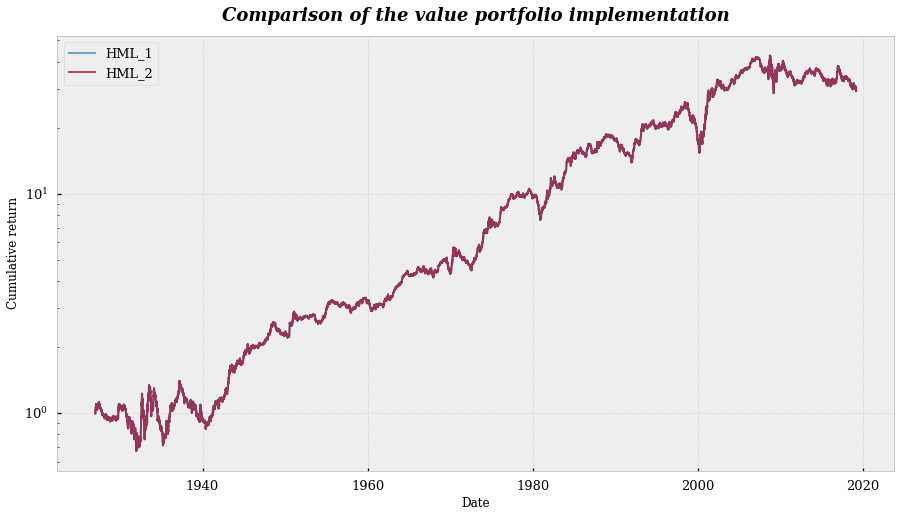

In [10]:
Compare_HML = pd.DataFrame(HML_check.loc[:, "HML"].values,
                           columns=["HML_1"],
                           index=HML_check.index)
Compare_HML["HML_2"] = HML_LS.loc[:, "HML_VW"].values
cumsum_plot(Compare_HML,
            title="Comparison of the value portfolio implementation")

Seems identical to me. Now let's do the same for the momentum factor (WML).

## Winners Minus Losers (WML) portfolio <a id='1.2'></a>

In [11]:
# load the data for the value factor
dic_WML = web.DataReader(MOMENTUM, 'famafrench', start=START_YEAR)
print(dic_WML['DESCR'])

6 Portfolios ME Prior 12 2 daily
--------------------------------

This file was created by CMPT_ME_PRIOR_RETS_DAILY using the 201902 CRSP database. It contains value- weighted returns for the intersections of 2 ME portfolios and 3 prior return portfolios. The portfolios are constructed daily. ME is market cap at the end of the previous day. PRIOR_RET is from - 250 to - 21. Missing data are indicated by -99.99 or -999. Copyright 2019 Kenneth R. French

  0 : Average Value Weighted Returns -- Daily (24281 rows x 6 cols)
  1 : Average Equal Weighted Returns -- Daily (24281 rows x 6 cols)


In [12]:
df_WML = dic_WML[0]
df_WML.index = df_WML.index.astype('datetime64[ns]')
df_WML.head(n=5)

,SMALL LoPRIOR,ME1 PRIOR2,SMALL HiPRIOR,BIG LoPRIOR,ME2 PRIOR2,BIG HiPRIOR
Date,,,,,,
1927-01-03,-0.30,-0.20,-0.78,-1.69,-0.57,-1.14
1927-01-04,0.53,0.08,0.30,0.68,0.22,0.53
1927-01-05,0.85,0.54,0.46,0.58,0.16,0.01
1927-01-06,0.11,-0.13,-0.20,-0.05,-0.34,-0.04
1927-01-07,0.04,0.13,0.72,-0.11,0.25,0.49


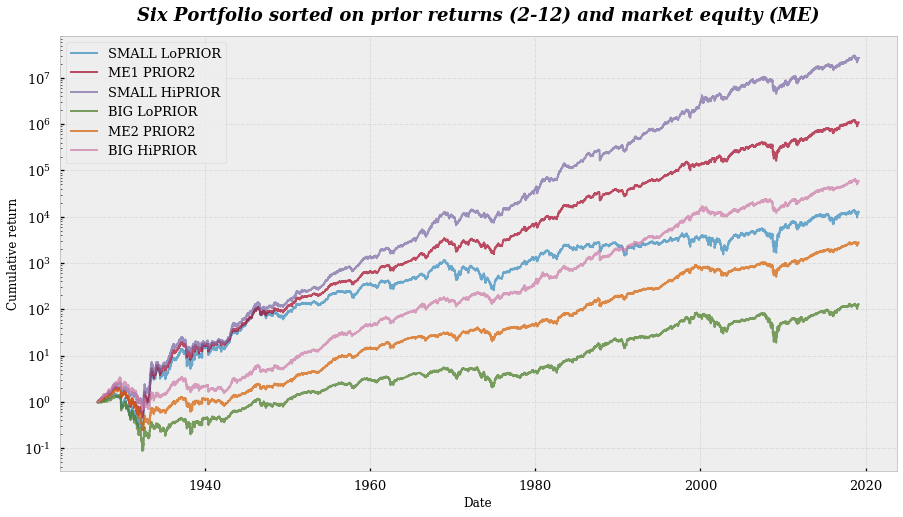

In [13]:
cumsum_plot(
    df_WML,
    title="Six Portfolio sorted on prior returns (2-12) and market equity (ME)"
)

### Construct WML long short portfolio

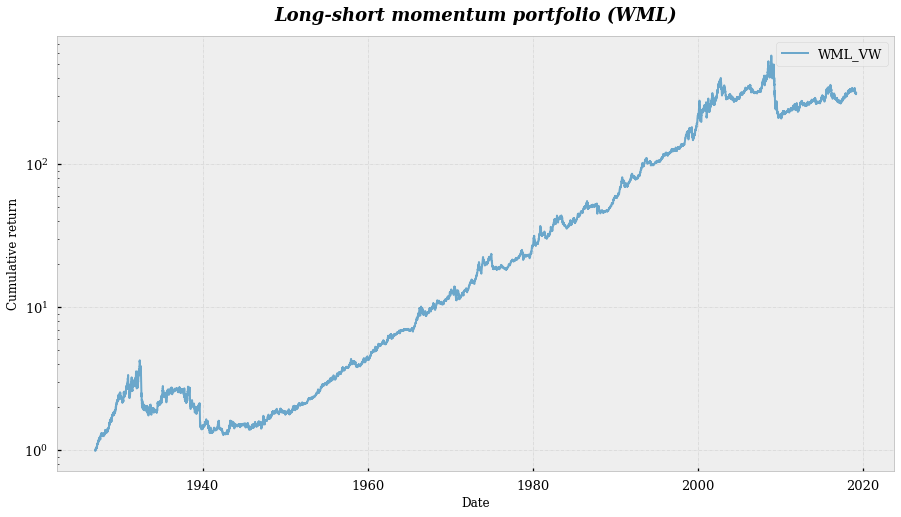

,WML_VW
Date,
1927-01-03,0.035
1927-01-04,-0.190
1927-01-05,-0.480
1927-01-06,-0.150
1927-01-07,0.640


In [14]:
# long short momentum portfolio
longs, shorts = ['SMALL HiPRIOR',
                 'BIG HiPRIOR'], ['SMALL LoPRIOR', 'BIG LoPRIOR']
WML_LS = pd.DataFrame(df_WML.loc[:, longs].sum(axis=1) / 2 -
                      df_WML.loc[:, shorts].sum(axis=1) / 2,
                      columns=['WML_VW'])  # momemtum weighted HML
# plot the cumulative return
cumsum_plot(WML_LS, title="Long-short momentum portfolio (WML)")
WML_LS.head(n=5)

In [15]:
dict_WML_check = web.DataReader(CHECK_MOMENTUM, 'famafrench', start=START_YEAR)
print(dict_WML_check['DESCR'])
WML_check = dict_WML_check[0]
WML_check.index = WML_check.index.astype('datetime64[ns]')
WML_check.head(n=5)

F-F Momentum Factor daily
-------------------------

This file was created by CMPT_ME_PRIOR_RETS_DAILY using the 201902 CRSP database. It contains a momentum factor, constructed from six value-weight portfolios formed using independent sorts on size and prior return of NYSE, AMEX, and NASDAQ stocks. MOM is the average of the returns on two (big and small) high prior return portfolios minus the average of the returns on two low prior return portfolios. The portfolios are constructed daily. Big means a firm is above the median market cap on the NYSE at the end of the previous day; small firms are below the median NYSE market cap. Prior return is measured from day - 250 to - 21. Firms in the low prior return portfolio are below the 30th NYSE percentile. Those in the high portfolio are above the 70th NYSE percentile. Missing data are indicated by -99.99 or -999. Copyright 2019 Kenneth R. French

  0 : (24281 rows x 1 cols)


,Mom
Date,
1927-01-03,0.03
1927-01-04,-0.19
1927-01-05,-0.48
1927-01-06,-0.15
1927-01-07,0.64


### Compare both WML long short portfolios
 - if my construction method is correct this should be exactly the same

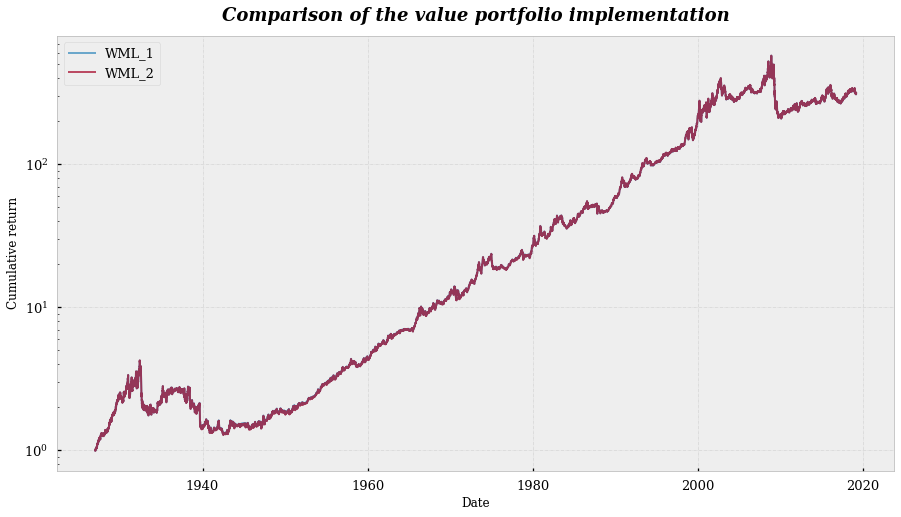

In [16]:
Compare_WML = pd.DataFrame(WML_check.loc[:, "Mom   "].values,
                           columns=["WML_1"],
                           index=WML_check.index)

Compare_WML["WML_2"] = WML_LS.loc[:, "WML_VW"].values
cumsum_plot(Compare_WML,
            title="Comparison of the value portfolio implementation")

## 50-50 Value Momemtum Portfolio <a id='1.3'></a>

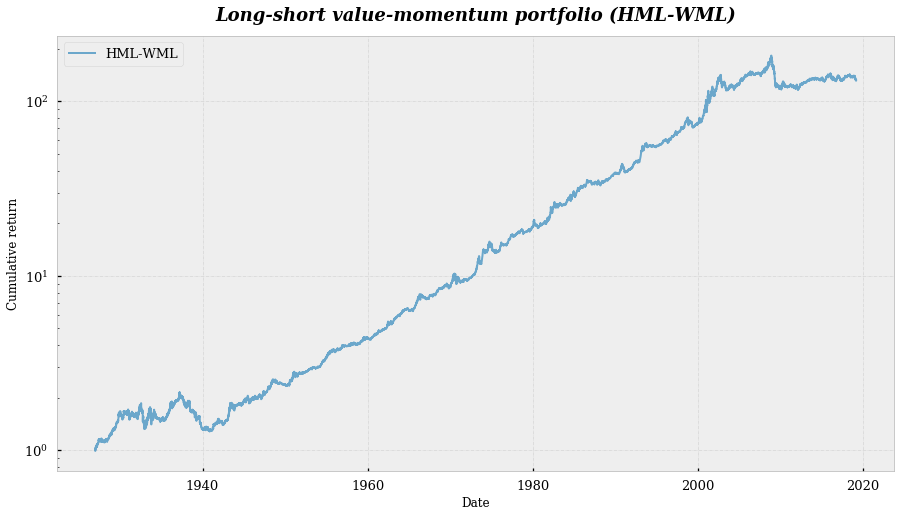

,HML-WML
Date,
1927-01-03,0.060
1927-01-04,-0.430
1927-01-05,-0.395
1927-01-06,-0.040
1927-01-07,0.540


In [17]:
w_HML, w_WML = 0.50, 0.50  #weights 50-50 weights (arbitrarely)

HML_WML = pd.DataFrame(HML_check.loc[:, ["HML"]].values * w_HML +
                       WML_check.loc[:, ["Mom   "]].values * w_WML,
                       columns=["HML-WML"],
                       index=WML_check.index)

cumsum_plot(HML_WML, title="Long-short value-momentum portfolio (HML-WML)")
HML_WML.head()

## Market Portfolio <a id='1.4'></a>

This is just the market (Mkt) portfolio minus the risk free rate (RF). I use this as the benchmark since basically every investor (including you and me) can buy this portfolio for almost no fee (there is no performance fee involved). You can think of this portfolio as the **[S&P500](https://en.wikipedia.org/wiki/S%26P_500_Index)**, but containing many more firms.

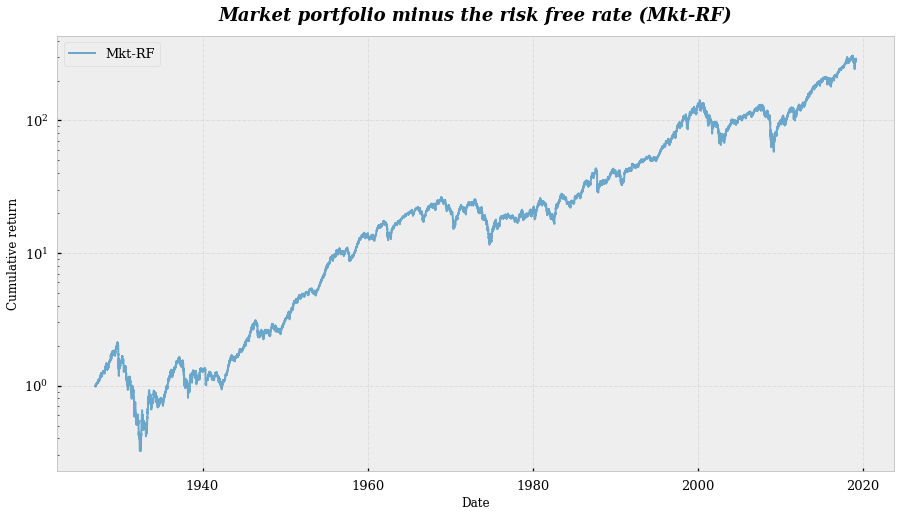

,Mkt-RF,SMB,HML,RF
Date,,,,
1927-01-03,-0.79,0.19,0.09,0.01
1927-01-04,0.31,0.15,-0.67,0.01
1927-01-05,0.14,0.43,-0.31,0.01
1927-01-06,-0.17,0.00,0.07,0.01
1927-01-07,0.30,-0.25,0.44,0.01


In [18]:
cumsum_plot(pd.DataFrame(HML_check.loc[:, "Mkt-RF"], columns=["Mkt-RF"]),
            title="Market portfolio minus the risk free rate (Mkt-RF)")
HML_check.head()

## Compare 4 factors
   - Market factor (Mkt-RF)
   - Value factor (HML)
   - Momemtum factor (WML)
   - 50-50 value-momemtum portfolio (HML-WML)

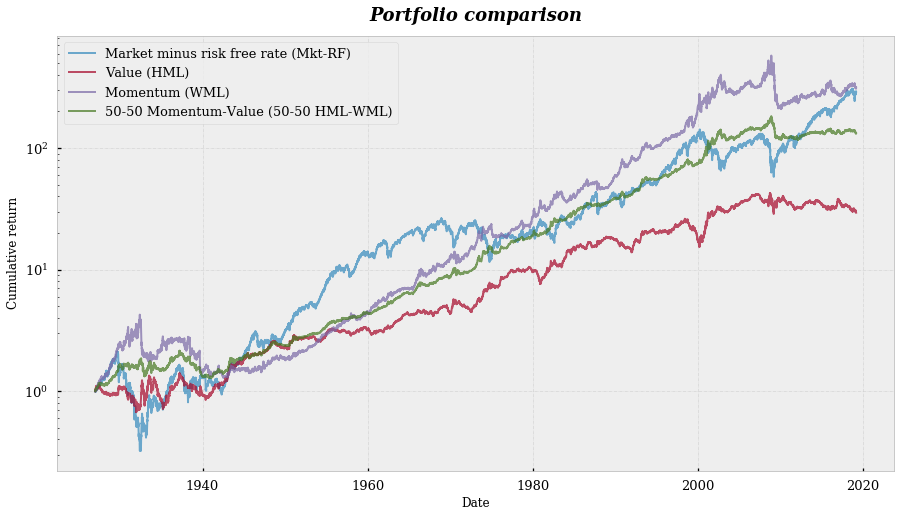

,Mkt-RF,HML,WML,HML-WML
Date,,,,
1927-01-03,-0.79,0.09,0.03,0.060
1927-01-04,0.31,-0.67,-0.19,-0.430
1927-01-05,0.14,-0.31,-0.48,-0.395
1927-01-06,-0.17,0.07,-0.15,-0.040
1927-01-07,0.30,0.44,0.64,0.540


In [19]:
# append all four portfolios together in one dataframe
df_factors = pd.DataFrame(HML_check.loc[:, ["Mkt-RF", "HML"]])
df_factors["WML"] = WML_check.iloc[:, 0]
df_factors["HML-WML"] = HML_WML.iloc[:, 0]

# alternative legend labels
dic_fac = {
    "Mkt-RF": "Market minus risk free rate (Mkt-RF)",
    "HML": "Value (HML)",
    "WML": "Momentum (WML)",
    "HML-WML": "50-50 Momentum-Value (50-50 HML-WML)"
}

# plot
cumsum_plot(df_factors, dic=dic_fac, title="Portfolio comparison")
df_factors.head()

<a id='Chapter2'></a>
# Chapter 2:  Risk- risk reward ratio's and Data exploration

Before starting with the simulation exercise, I introduce some performance statistics and perform some data exploration. The goal is to gain insights that give us intuition about the data.

## Return and risk reward ratio's <a id='2.1'></a>

**In case when working with log returns:** 

- I was considering to change to log returns for computational speed, but then decided it was not worth the effort (maybe I will take another look)

The **geometric mean** of quantities $\left\{a_{1}, \dots, a_{n}\right\}$ is

\begin{equation}
\overline{a}_{g}=\left(\prod_{i=1}^{n} a_{i}\right)^{1 / n}
\end{equation}

Taking the logarithm of both sides gives
\begin{equation}
\log \overline{a}_{g}=\frac{1}{n} \sum_{i=1}^{n} \log a_{i}
\end{equation}


so the log of the geometric mean is equal to the arithmetic mean of the logs.
In  case, the relevant quantities $a_i$ are the growth rates over each period

\begin{equation}
a_{i}=1+r_{i}
\end{equation}

and plugging this into the above equation gives

\begin{equation}
\log \left(1+\overline{r}_{g}\right)=\frac{1}{n} \sum_{i=1}^{n} \log \left(1+r_{i}\right)
\end{equation}

\begin{equation}
\overline{r}_{g}=\exp \left(\frac{1}{n} \sum_{i=1}^{n} \log \left(1+r_{i}\right)\right)-1
\end{equation}


Sometimes the geomtric return is  approximated by the following formula:

\begin{equation}
\overline{r}_{g}=\frac{1}{n} \sum_{i=1}^{n} \log \left(1+r_{i}\right)
\end{equation}

this is because when the growth rate is small,

\begin{equation}
\log \left(1+\overline{r}_{g}\right) \approx \overline{r}_{g}
\end{equation}

it is often an approximation that you can get away with

**Simple raw returns**

- **Arithmetic return**: \begin{equation} R_{a} =
\frac{1}{n} \sum_{i=1}^{n} r_{i}=\frac{r_{1}+r_{2}+\cdots+r_{n}}{n}
\end{equation}

suppose our arithmetic return is at daily frequency, to annualize this I take $(R_a)\times 252$ (assuming 252 trading days in a year)

- **Geometric return**: \begin{equation} R_{g} = 
\sqrt[n]{\left(1+r_{1}\right) \times\left(1+r_{2}\right) \times \ldots\left(1+r_{n}\right)}
\end{equation}

suppose our geometric return is at daily frequency, to annualize this I take $(R_g)^{252} - 1$ (assuming 252 trading days in a year)


- **Sharpe ratio**: one of the most common risk-reward ratios used in finance is the Sharpe ratio. The Sharpe ratio discounts the expected excess returns of a portfolio $ {E(r)-r_{f}} $ by the volatility of the returns $\sigma_r$. Formally, this can be described as follow:


\begin{equation}
S=\frac{E\left(r_{e}\right)}{\sigma_{r}}=\frac{E(r)-r_{f}}{\sigma_{r}}
\end{equation}

where $\sigma=\sqrt{\sigma^{2}}=\sqrt{\frac{1}{N} \sum_{i=1}^{N}\left(r_{i}-\mu\right)^{2}} \text {and } \mu=\frac{1}{N} \sum_{i=1}^{N} r_{i}$

**Crude estimation of annualized volatility**

Most often volatility is annualized by multiplying by $\sqrt(n)$ where $n$ represents the time period (number of trading days or trading months). The formula uses the the fact that the standard deviation of the sum of $n$ independent variables (with equal standard deviations) is $\sqrt(n)$ times the standard deviation of the individual variables. This is only a crude approximation of the true volatility observed in financial markets and is only an accurate extrapolation if prices follow a random walk or Wiener process, whose steps have finite variance. As a result we will probably underestimate volatility. There are other ways (probably better) to measure volatility, but these are not the focus of this project.

**Lower Partial Moments (LPM)**

Whereas measures of risk-adjusted return based on volatility treat all deviations from the mean as risk, measures of risk-adjusted return based on lower partial moments  consider only deviations below some predefined minimum return threshold, $\tau$ as risk. For example, negative deviations from the mean is risky whereas positive deviations are not. A lower partial moment of order $j$ can be estimated from a sample of $k$ returns as follows: \begin{equation}
L P M_{j}(\tau)=\frac{1}{k} \sum_{i=1}^{k} \max \left(\tau-r_{i}, 0\right)^{j} \end{equation}


A useful classification of measures of risk-adjusted returns based on lower partial moments is by their order. The larger the order the greater the weighting will be on returns that fall below the target threshold, meaning that larger orders result in more risk-averse measures. Some popular measures using the equation above are:

   - **The Sortino ratio** was proposed as a modification to the Sharpe ratio. It discounts the excess return of a portfolio above a target threshold by the volatility of downside returns, $\delta^{2}$, instead of the volatility of all returns, $\sigma^2$. The volatility of downside returns is equivalent to the square-root second-order lower partial moment of returns. More formally this can be described as follow:
   
   \begin{equation}
S O R(\tau)=\frac{E\left(r_{e}\right)}{\delta^{2}}=\frac{E(r)-\tau}{\delta^{2}}=\frac{E(r)-\tau}{\sqrt{L P M_{2}(\tau)}}
\end{equation}
   

   - **The Omega ratio** discounts the excess returns of a portfolio above the target threshold, usually the risk-free rate, by the first-order lower partial moment of the returns. The first-order lower partial moment corresponds to the average expected loss also known as downside risk. Mathematically the omega ratio is defined as follow:
   
   \begin{equation}
\Omega(\tau)=\frac{E\left(r_{e}\right)}{L P M_{1(\tau)}}=\frac{E(r)-\tau}{L P M_{1}(\tau)}
\end{equation}
   

   - **The Kappa ratio** is a generalization of Omega and Sortino ratio first proposed in 2004 by Kaplan and Knowles.  It was shown that when the parameter $j$ of the Kappa ratio is set to one or two you get the Omega or Sortino ratio. The Kappa ratio is most often used with $j=3$ which is why it is often referred to as the Kappa 3 ratio. Mathematically this is defined as follow:
   
   \begin{equation}
K_{j}(\tau)=\frac{E\left(r_{e}\right)}{\sqrt[j]{L P M_{j}(\tau)}}=\frac{E(r)-\tau}{\sqrt[j]{L P M_{j}(\tau)}}
\end{equation}


Another measure to look at is risk is **Drawdown**.  It is the maximum decrease in the value of the portfolio over a specific period of time. Given the historical prices (values) for a portfolio, $S$, and a period of time, $t$, the drawdown of length $t$ over that period of time is the maximum distance between a previous two values $S_x$ and $S_{x−t}$,
   
   \begin{equation}
D(t)=\max \left\{0, \max _{t_{i} \in(0, t}\left\{S_{t_{i}}-S_{t_{i}-t}\right\}\right\}
\end{equation}


**Maximum drawdown** can be thought of as a list of drawdowns calculated from the same historical portfolio values, $S$, but for the whole time period (or for different sub time periods, rolling window). The maximum drawdown of a portfolio is the maximum decrease in portfolio value from a previous high to a new low.

**% Time underwater** is the percentage time the investment is in in a drawdown state. 

Personally, I like measures based on drawdowns since they are extremely intuitive and are IMO are a very natural way to look at risk. Contrary to other measures, drawdown is path dependent. Furthermore, I very much enjoyed the presentation of Rober Frey (Former Quant of the Medallion fund) on drawdown [**180 years of market drawdown [8]**](https://www.youtube.com/watch?v=27x632vOjXk&t=3349s).

### Helper functions
 - `Kappa_ratio:` calculates the kappa ratio 
 - `drawdown:` calculates drawdown
 - `Anonymous functions (lambda):` performance functions stored in a dictionary
 -  `perf_stats:` a wrapper around the anonymous functions to give the possibility for selecting the function(s) of interest
 - `Return_DD:`calculates the cumulative return and drawdown in one figure


In [20]:
"""
some anonymous function to calculate various (performance) statistics,
these functions are stored in a dictionary

params:

    - df: pandas dataframe with the raw returns
    - time_freq: an integer indicating the number of trading days
    - treshold: a float determining the level of drawdown is taken into account
      when calculating the percentage of time an investment is in a drawdown state

returns:

    - numpy array with the calculted statistic
"""

P_AR = lambda df, time_freq=FREQUENCY: np.mean(df) * time_freq
P_GR = lambda df, time_freq=FREQUENCY: (gmean((1 + df / 100))**time_freq - 1
                                        ) * 100
P_AVol = lambda df, time_freq=FREQUENCY: df.std() * np.sqrt(time_freq)
P_GVol = lambda df, time_freq=FREQUENCY: (np.exp(np.std(np.log(1 + df / 100)))
                                          - 1) * np.sqrt(time_freq) * 100

# put functions in a dictionary, so we can choose which one to call and
# which not (for the simulation)
perf_stats_dic = {
    "Skew": (lambda df: df.skew().values),
    "Kurtosis": (lambda df: df.kurtosis().values),
    "Terminal Wealth Relative":
    (lambda df: (1 + df / 100).cumprod().iloc[-1, :] - 1),
    "Arithmetric Return (%)":
    (lambda df, time_freq=FREQUENCY: P_AR(df, time_freq).values),
    "Geometric Return (%)":
    (lambda df, time_freq=FREQUENCY: P_GR(df, time_freq)),
    "Arithmetric Volatility (%)":
    (lambda df, time_freq=FREQUENCY: P_AVol(df, time_freq).values),
    "Geometric Volatility (%)":
    (lambda df, time_freq=FREQUENCY: P_GVol(df, time_freq)),
    "Arithmetric SR": (lambda df, time_freq=FREQUENCY: P_AR(df, time_freq) /
                       P_AVol(df, time_freq)),
    "Geometric SR": (lambda df, time_freq=FREQUENCY: P_GR(df, time_freq) /
                     P_GVol(df, time_freq)),
    "Maximum Drawdown (%)": (lambda df: drawdown(df).max().values * 100),
    "Underwater (%)": (lambda df: (drawdown(df) != 0).sum() / len(df) * 100),
    f"(%) Underwater >{20} %":
    (lambda df, treshold=0.20: (drawdown(df) > treshold).sum() / len(df) * 100)
}

## Exploratory Data Analysis (EDA) <a id='2.2'></a>

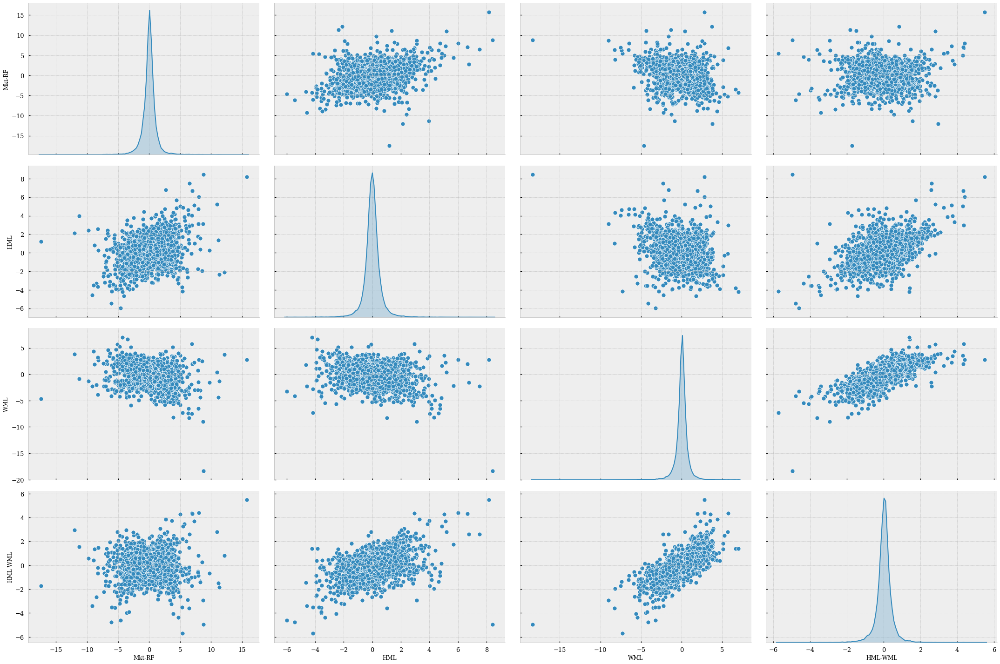

In [21]:
g = sns.pairplot(df_factors, height=5, aspect=1.5, diag_kind="kde")

### Full sample period: 1927:2019

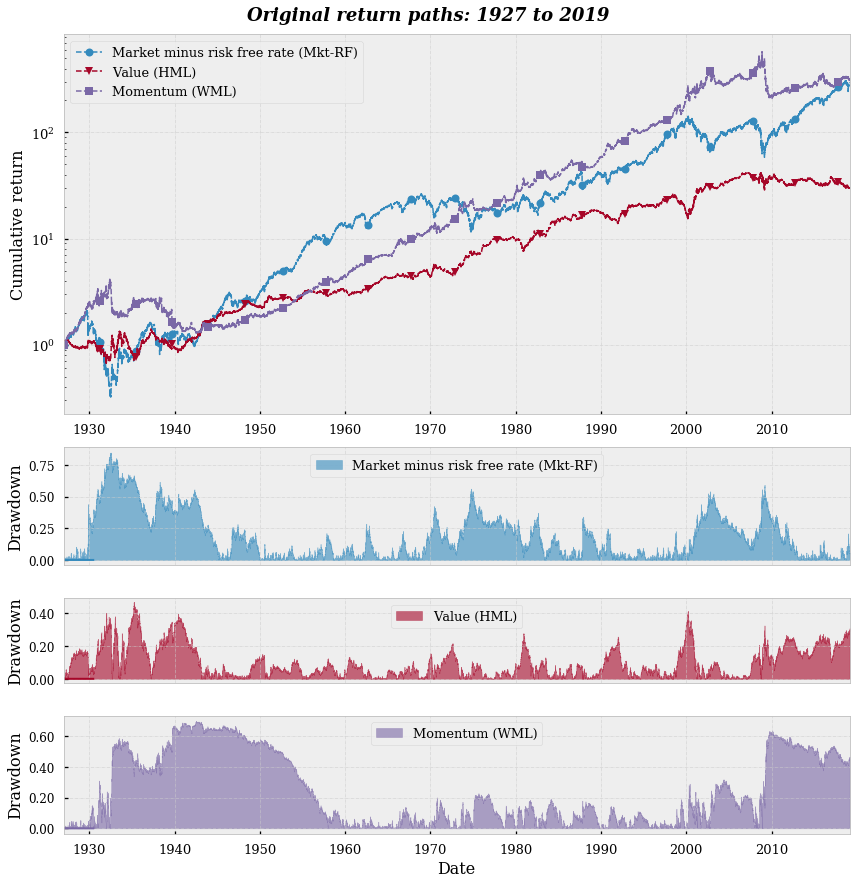

In [22]:
Return_DD(df=df_factors, dic_labels=dic_fac, loc='upper center',time_frequency=FREQUENCY)
# plt.savefig('Cum_return_DD', bbox_inches='tight') # save plot

###  Period: 1927-1935
 - crash of 1930

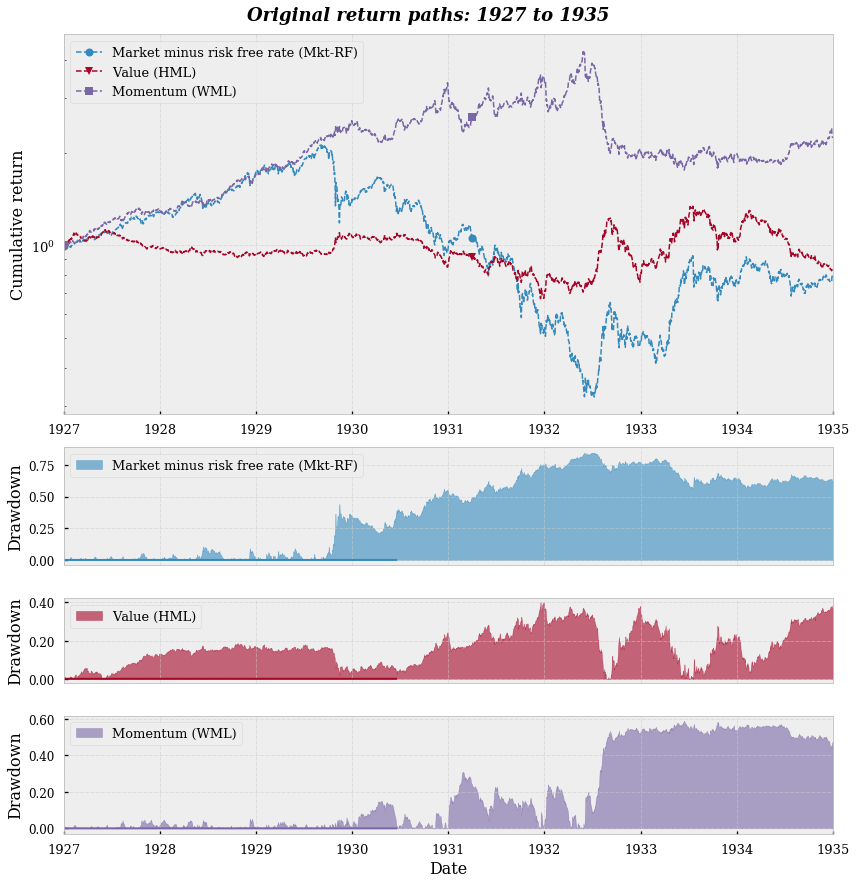

In [23]:
start, end = datetime.date(year=1927, month=1, day=1), datetime.date(year=1935,
                                                                     month=1,
                                                                     day=1)
Return_DD(df=df_factors,
          dic_labels=dic_fac,
          loc='upper left',
          start=start,
          end=end,
          time_frequency=FREQUENCY)

### Period: 1998-2010
 - chrash of 2000 with the internet buble
 - chrash of 2007

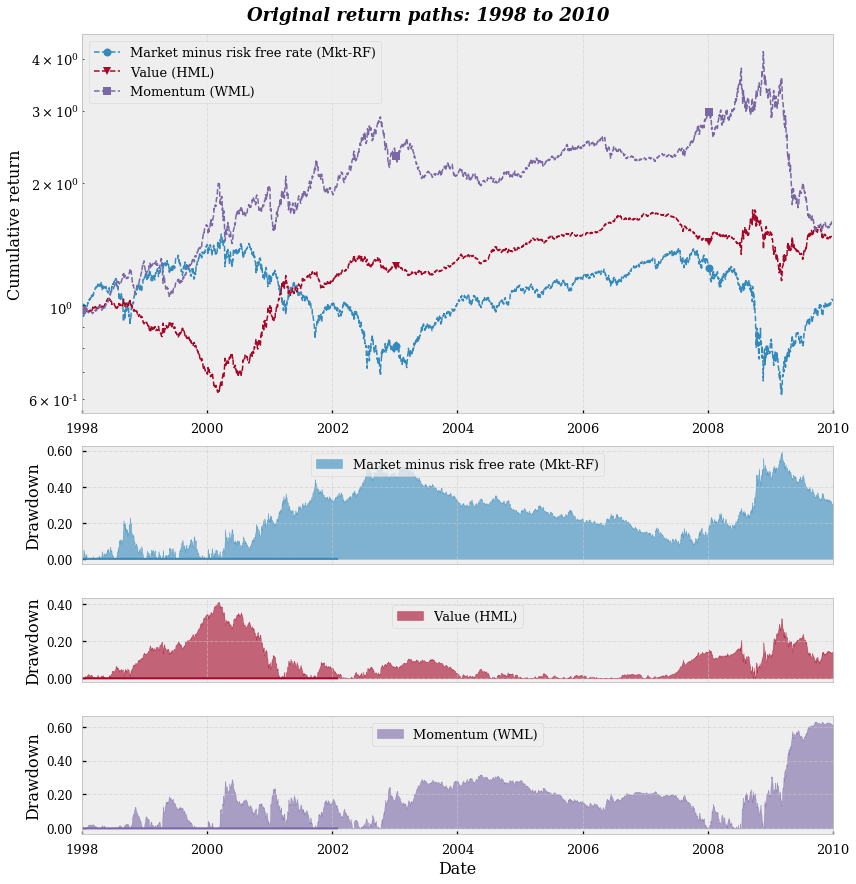

In [24]:
start, end = datetime.date(year=1998, month=1, day=1), datetime.date(year=2010,
                                                                     month=1,
                                                                     day=1)
Return_DD(df=df_factors,
          dic_labels=dic_fac,
          loc='upper center',
          start=start,
          end=end,
          time_frequency=FREQUENCY)

In all serious drawdown periods, momentum crashes when the market starts rebouncing. This is in line what's described in the literature. Also note the negative correlation between value and momentum and momentum and the market.

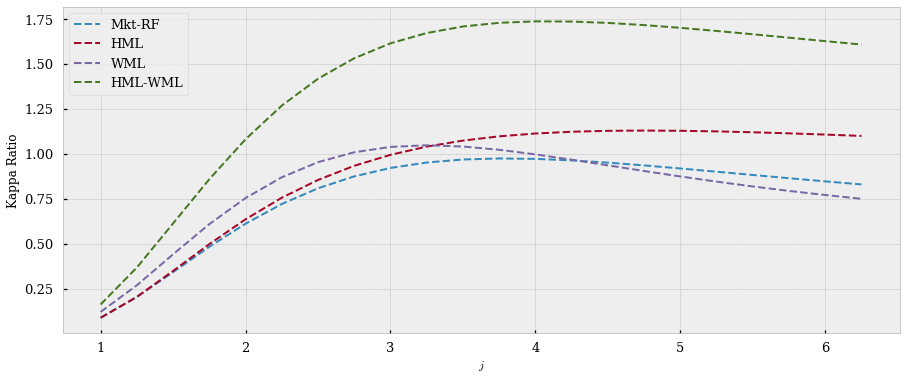

In [25]:
dic = {i: kappa_ratio(df_factors, order=i, time_frequency=FREQUENCY) for i in (np.arange(1, 6.5, 0.25))}
out = pd.DataFrame(dic).T
out = out.rename(columns={0: "Mkt-RF", 1: "HML", 2: "WML", 3: "HML-WML"})
fig = figsize = (15, 8)
fig, (ax1) = plt.subplots(1, 1, figsize=(15, 6))
for i, c in enumerate(out.columns):
    ax1.plot(out.index, out[c], label=str(c), linestyle="--")
    ax1.set_xlabel("$j$")
    ax1.set_ylabel("Kappa Ratio")
    ax1.legend(loc='best')

Increasing the power ($j$) of the `kappa ratio` gives higher weight to deviations below the treshold ($\tau$=0). It is interesting to see that the  momenetum strategy intially has a higher kappa ratio, but get surpassed around $j=3$ by the value portfolio. This means the momentum portfolio contains some large negative returns (tail events).

In [26]:
round(perf_stat(df=df_factors, dic_perf=perf_stats_dic , stats="all"), 3)

,Mkt-RF,HML,WML,HML-WML
Skew,-0.117,0.741,-1.607,-0.417
Kurtosis,16.584,15.839,27.195,14.030
Terminal Wealth Relative,290.565,28.407,312.892,130.807
Arithmetric Return (%),7.324,3.940,6.671,5.306
Geometric Return (%),6.067,3.571,6.148,5.197
Arithmetric Volatility (%),16.915,9.294,11.813,6.910
Geometric Volatility (%),17.029,9.302,11.935,6.930
Arithmetric SR,0.433,0.424,0.565,0.768
Geometric SR,0.356,0.384,0.515,0.750
Maximum Drawdown (%),84.802,46.827,69.821,40.260


In [27]:
round(df_factors.describe(), 2)

,Mkt-RF,HML,WML,HML-WML
count,24281.00,24281.00,24281.00,24281.00
mean,0.03,0.02,0.03,0.02
std,1.07,0.59,0.74,0.44
min,-17.44,-5.98,-18.33,-5.71
25%,-0.40,-0.24,-0.24,-0.15
50%,0.06,0.01,0.06,0.04
75%,0.49,0.26,0.34,0.21
max,15.76,8.43,7.01,5.48


**Some observations with respect to performance assessment of the four portfolios**

- Momentum seems to be the more "risky" strategy when looking at `skewness, kurtosis, kappa ratio` though it has not the highest `drawdown`. Note that the Sharpe ratio does not reveal this sort of information ( IMO, it does not make much sense to look at the Sharpe ratio when returns are not normally distributed).


- **Around 93%** of the time, the portfolios are in a state of drawdown (a state of regret). Meaning if we pick a random day, this is very high likelihood, there is some point in time we had more money. I think this an underappreciated fact and has a big impact on emotional state of investors. Note, this is not something specific for value or momentum investing. It is a feature of most investment strategies (even very good ones, see [**180 years of market drawdown [8]**](https://www.youtube.com/watch?v=27x632vOjXk&t=3349s)).


- Big differences between the four portfolios when looking at the `(%) underwater > 20 %` (I kind of arbitrarily chose 20 % to indicate a big drawdown). The difference is espcially big between the value and momentum strategy (43% vs 17%). Momentum experiences two very big drawdown period 1930-1960 and 2009-today.


- Combining value and momentum (HML-WML) improves risk adjusted performance on almost all statistics, though this relation is time dependent and seems to have disappeared over the last decade.


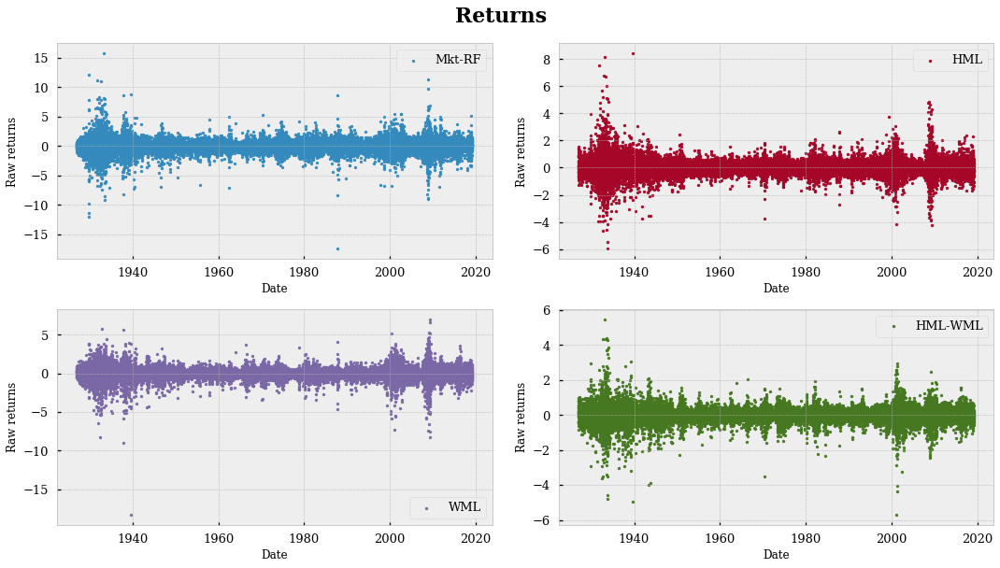

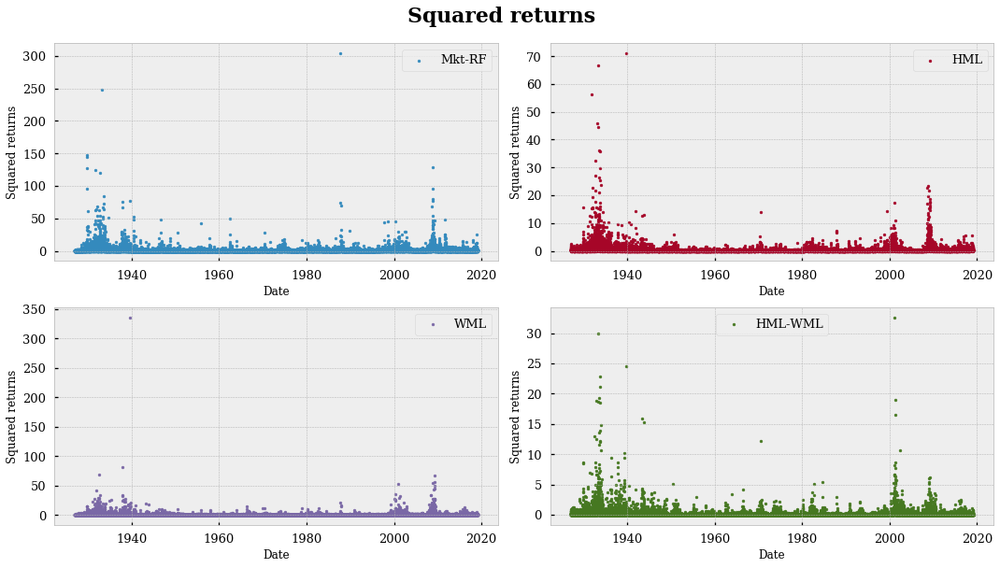

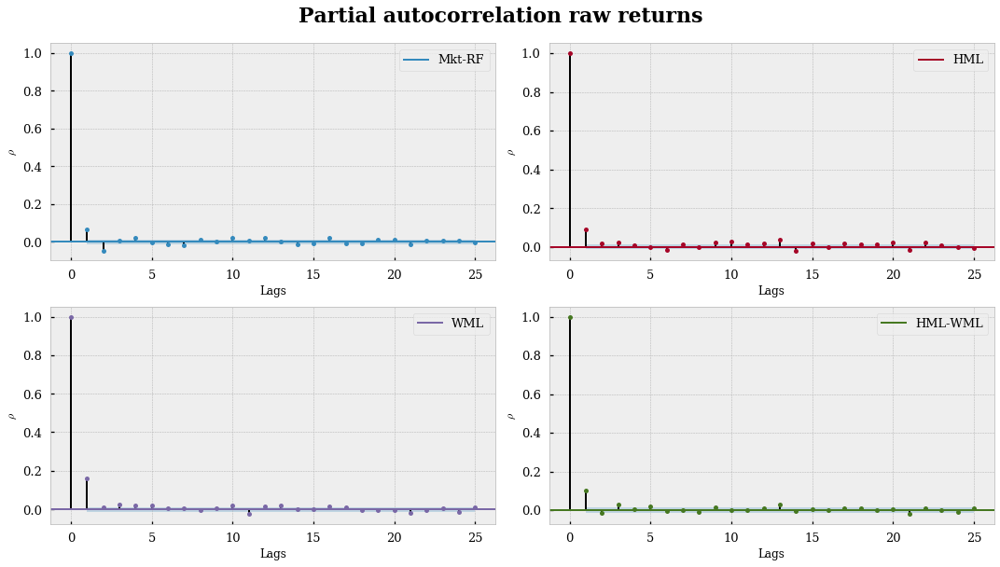

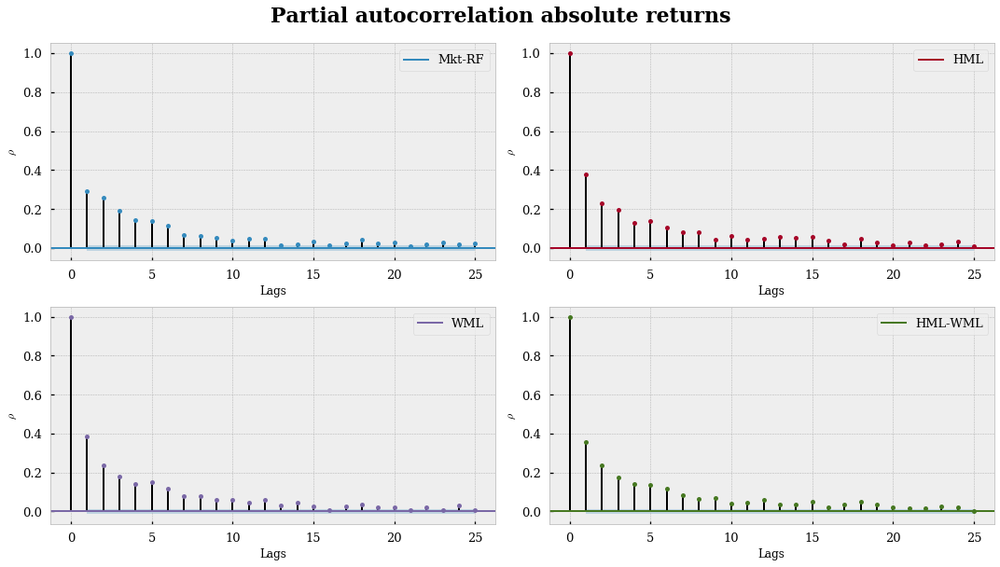

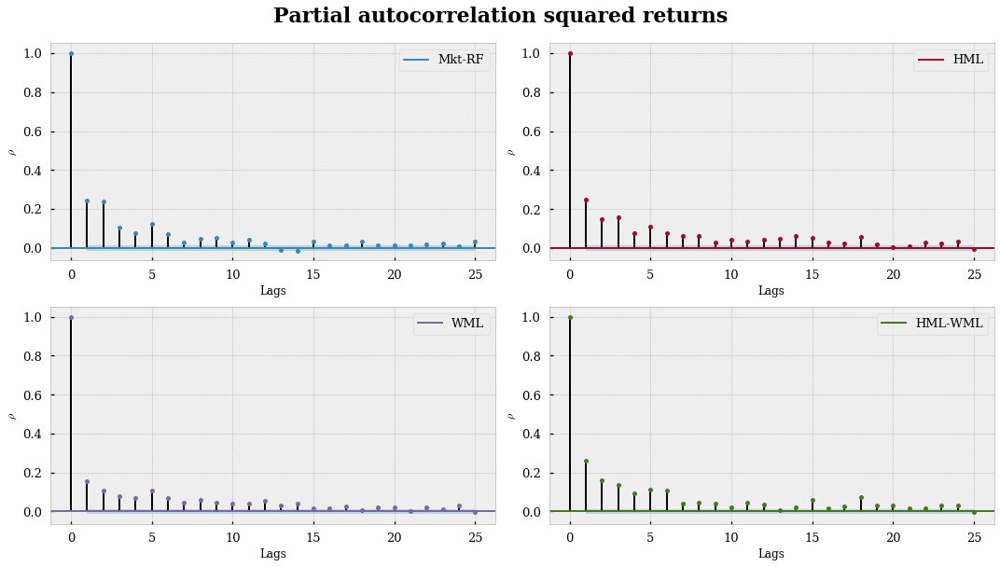

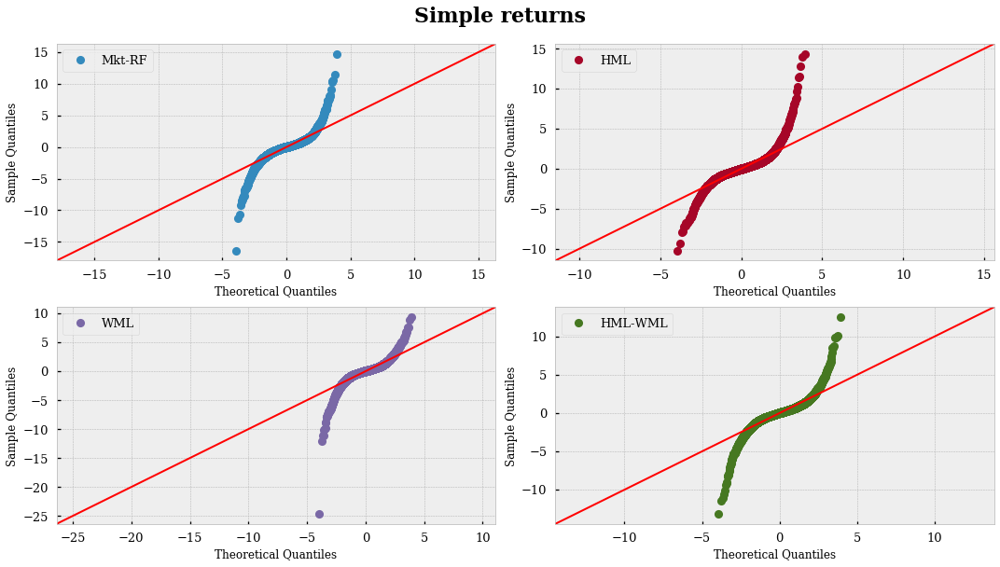

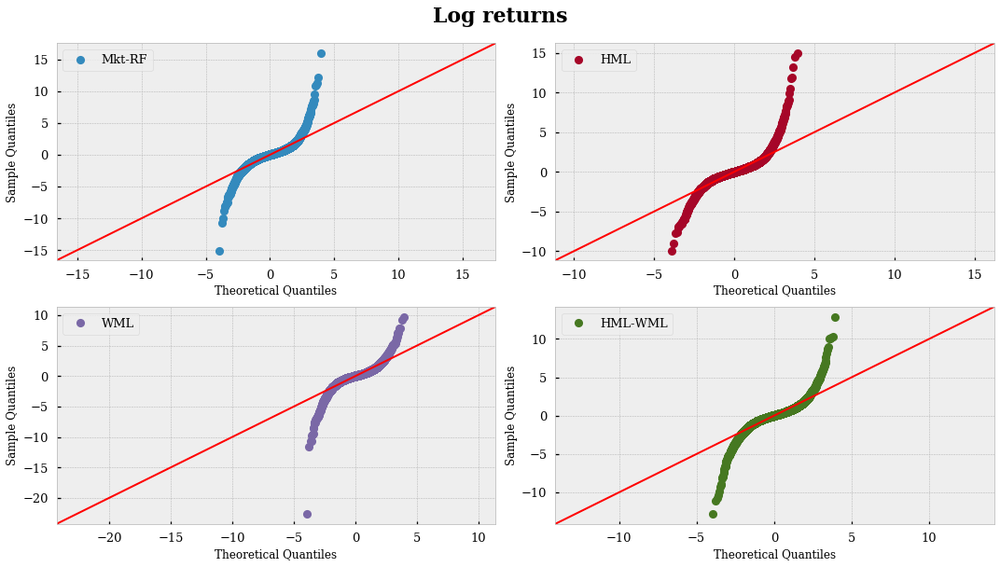

In [28]:
# Returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors.columns):
    axs[i].scatter(df_factors.index,
                   df_factors.iloc[:, i].values,
                   label=j,
                   color=set2[i],
                   s=8)
    axs[i].set_xlabel("Date")
    axs[i].set_ylabel("Raw returns")
    axs[i].legend(loc="best")
plt.tight_layout()
plt.suptitle('Returns', y=1.05, fontsize=22, fontweight="bold")

# Squared returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors.columns):
    axs[i].scatter(df_factors.index,
                   df_factors.iloc[:, i].values**2,
                   label=j,
                   color=set2[i],
                   s=8)
    axs[i].set_xlabel("Date")
    axs[i].set_ylabel("Squared returns")
    axs[i].legend(loc="best")
plt.tight_layout()
plt.suptitle('Squared returns', y=1.05, fontsize=22, fontweight="bold")

# Partial autocorrelation: returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors.columns):
    plot_pacf(df_factors.iloc[:, i].values,
              ax=axs[i],
              label=j,
              lags=25,
              color=set2[i])
    axs[i].set_xlabel("Lags")
    axs[i].set_ylabel('$\\rho$')
    axs[i].set_title("")
    #axs[i].set_ylim(-0.5,0.5)
    handles, labels = axs[i].get_legend_handles_labels()
    handles = handles[:-len(handles) // 3][0::1]
    labels = labels[:-len(handles) // 3][0::1]
    axs[i].legend(handles=handles, labels=labels, loc='best')
plt.tight_layout()
plt.suptitle('Partial autocorrelation raw returns',
             y=1.05,
             fontsize=22,
             fontweight="bold")

# Partial autocorrelation: squared returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors.columns):
    plot_pacf(abs(df_factors.iloc[:, i]).values,
              ax=axs[i],
              label=j,
              lags=25,
              color=set2[i])
    axs[i].set_xlabel("Lags")
    axs[i].set_ylabel('$\\rho$')
    axs[i].set_title("")
    #axs[i].set_ylim(-0.5,0.5)
    handles, labels = axs[i].get_legend_handles_labels()
    handles = handles[:-len(handles) // 3][0::1]
    labels = labels[:-len(handles) // 3][0::1]
    axs[i].legend(handles=handles, labels=labels, loc='best')
plt.tight_layout()
plt.suptitle('Partial autocorrelation absolute returns',
             y=1.05,
             fontsize=22,
             fontweight="bold")

# Partial autocorrelation: squared returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors.columns):
    plot_pacf(df_factors.iloc[:, i].values**2,
              ax=axs[i],
              label=j,
              lags=25,
              color=set2[i])
    axs[i].set_xlabel("Lags")
    axs[i].set_ylabel('$\\rho$')
    axs[i].set_title("")
    #axs[i].set_ylim(-0.5,0.5)
    handles, labels = axs[i].get_legend_handles_labels()
    handles = handles[:-len(handles) // 3][0::1]
    labels = labels[:-len(handles) // 3][0::1]
    axs[i].legend(handles=handles, labels=labels, loc='best')
plt.tight_layout()
plt.suptitle('Partial autocorrelation squared returns',
             y=1.05,
             fontsize=22,
             fontweight="bold")

# QQplot: simple returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors.columns):
    sm.qqplot(df_factors.iloc[:, i].values,
              fit=True,
              line='45',
              label=j,
              ax=axs[i],
              color=set2[i])
    axs[i].legend(loc="best")
plt.tight_layout()
plt.suptitle('Simple returns', y=1.05, fontsize=22, fontweight="bold")

# QQplot: log returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors.columns):
    sm.qqplot(np.exp(1 + df_factors.iloc[:, i].values / 100),
              fit=True,
              line='45',
              label=j,
              ax=axs[i],
              color=set2[i])
    axs[i].legend(loc="best")
plt.tight_layout()
plt.suptitle('Log returns', y=1.05, fontsize=22, fontweight="bold");

**some observations (all strategies)**

 - Returns are hetroskedastic:  return volatility is high during the 1930s, and one can argue that this period is a different regime, unlikely to repeat (some papers exclude the period 1927-1963 because of this, I personally disagree with this). In contrast, 1941–1962 is a period of relatively low return volatility. Thereafter, we observe similar behavior as in the 1930's.
 - Serial correlations in the simple returns is rather low, but much higher serial correlations in the absolute and squared returns (I am quite surprised, this is promising for the second part of the thesis).
 - Return are not normally distributed (simple and log).

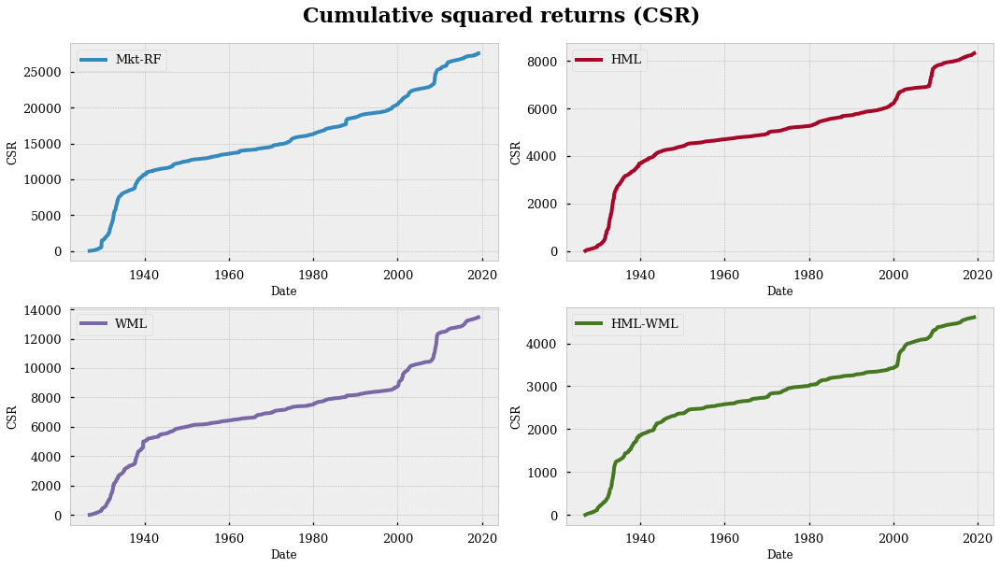

In [29]:
# Cumulative squared returns
fig, axs = plt.subplots(2, 2, figsize=(15, 8))
axs = axs.ravel()
for i, j in enumerate(df_factors.columns):
    axs[i].plot(df_factors.index, (df_factors.iloc[:, i]**2).cumsum(),
                label=j,
                color=set2[i],
                lw=4)
    axs[i].legend(loc="best")
    axs[i].set_ylabel("CSR")
    axs[i].set_xlabel("Date")
plt.tight_layout()
plt.suptitle('Cumulative squared returns (CSR)',
             y=1.05,
             fontsize=22,
             fontweight="bold");

**Cumulative Squared Returns (CSR)**

The CSR is a “quick and dirty” approach to look at volatility regimes. The variance, $\sigma_r^2$, of return can be expressed by the following, where $R$  is the random variable representing return:

\begin{equation}
\sigma_{r}^{2}=\mathrm{E}\left[R^{2}\right]-\mathrm{E}[R]^{2}
\end{equation}

If we take the maximum likelihood estimate (MLE) for the sample variance, $\hat{s}_r^2$ , and multiply both sides by the sample size, $n$ , we have

\begin{equation}
n \hat{s}_{r}^{2}=\sum_{t=1}^{n} r(t)^{2}-\frac{\left(\sum_{t=1}^{n} r(t)\right)^{2}}{n}
\end{equation}

For most return time series the term to the left of the minus sign is much larger than the term on the right. This leads to the following approximation:

\begin{equation}
n \hat{s}_{r}^{2} \simeq \sum_{t=1}^{n} r(t)^{2}
\end{equation}

Thus, when plotting the cumulative square returns (CSR), the slope of the CSR line is approximately the variance of those returns. If the return switches from one stable volatility regime to another, then this shift shows as an abrupt change in slope of the CSR. This is a simple but powerful exploratory data analysis technique. The idea is to gain insights that give intuition about the data. Of course, you want to make sure that our insights make sense, but at this stage I am not super concerned with the formalities.


Looking at the CSR it does appear that a piecewise model yields a reasonably good description. There are extended periods where the slope is roughly constant, and these are separated by definite knits showing rapid transition from one regime to another.

**Next steps (difficult in python)**

My next step was to approximate the CSR with a piecewise linear model and look how these slopes change over time. The slope of the $i^{th}$ line segment ($\tau$)  would  the estimate of the constant variance. If we multiple each variance by $12$ or $252$ (depending if you use monthly or daily data) and then take the square root, then we have an annualized estimate of the standard deviation:

\begin{equation}
\hat{S}_{\text { annual }}\left(\tau_{i}\right)=\sqrt{252 \times \hat{s}_{\text { daily }}\left(\tau_{i}\right)^{2}}
\end{equation}


Doing the above in the **R programming language** seems a lot more practical (there are some packages which identify changing points). So far, I have experimented a bit with this, the problem is determining the cutpoints to fit the piecewise model (a tried with a simple decidision tree which gave actually nice results). If I have time left, I will take another look at this. Suggestions are also welcome.

<a id='Chapter3'></a>

# Chapter 3: Simulation analysis Part 1

It seems likely that the characteristics of long-horizon returns are of central interest to investors saving for distant payoffs. If so, it is likely that the characteristics of long-horizon returns affect asset pricing in ways missed by traditionel models. Evidence on distributions of long-horizon returns is a logical first
step in remedying this deficiency. I use simulations to study distributions of U.S. stock returns the distributions of annual, and 3-, 5-, 10-, 20-, and 30-year returns on the  Market portfolio (Mkt-RF), value portfolio (HML), a momentum portfolio (WML)  and a 50-50 value-momentum portfolio (HML-WML) of U.S. stocks for January 1927 to February 2019 (henceforth 1927–2019). Sample sizes shrink quickly as the return horizon increases. I use (bootstrap) simulations to fill in details of long horizon return distributions. 

**Portfolios**

- market (Mkt-RF)
- Value (HML)
- Momentum (WML)
- 50-50 Value-Momentum (HML-WML) 

**simulations methods**

   - sample returns from a normal distributions using the $\mu$ and $\sigma$ estimated from the data
   - Independent identical distributed (i.i.d.) bootstrap
   - circular bootstrap
   - stationairy bootstrap

**statistics of interest**

I focus on the following three statistics which I consider important elements of any investment strategy:
 
 - geometric return (annualized) 
 - the number of times we end up with a positive return (based on geometric return)
 - Maximum Drawdown
 
Regarding the maximum drawdown, I am concerned whether this makes sense, since this is an extrema statistic.

**Investment horizon**

- 1-3-5-10-20-30 years

Regarding **geometric return**, I expect it to converge toward a normal distributions (this is a rather simple and well behaved statistic) as the investment horizon increases. I'm most of all curious about how fast the variance will drop as you increase the investment horizon.

Regarding **maximum drawdown**, I honestly don't know what to expect (maybe some kind of right skewed distribution?). As you increase the investment horizon you will experience larger maximum drawdown by construction (your biggest loss is in the future). Does it even makes sense to look at such a statistic in a bootstrap setting?

### Helper functions

 - `boot:` iterates over the bootstrap paths and puts it into a dataframe
 - `plot_realizations:` plots $n$ (default 50) randomly chosen paths to get and idea of the simulated returns paths. This is visualized when calling the simulation method.
 - `plot_summary_stats:` visualizes the histograms from all the statistics when calling the bootstrap method (the default setting is not showing since this is a bit too much output)
 - `investment_horizons:` wraps around the functions from above and iterates over the simulation methods
 - `permutation_plot:` visualizes the permuted sample statistic(s) of interest. Note this will show the same histogram as those in `plot_summary_stats`
 - `append_stats:` appends the calculated statistic together in a pandas dataframe for each:
      - strategy
      - simulation method
      - investment horizon

 - `performance_matrix:` calculates the summary statistics of the permuated histograms
 - `describe_dist:` shows the summary statisitcs (calculated in `performance_matrix:`)  in a multi index dataframe


### Class

 - `Simulations:` a wrapper around the function `investment_horizon`. It contains 5 methods to perform the simulation:
      - sample from a normal distribution
      - iid boostrap
      - mbb
      - cbb 
      - sb
      
      
All information regarding the bootstrap is stored into a dictionary **store_output_dic**. This dictionary consist out of several sub dictionaries. You can think of it as a tree structure: 

 -  At the highest level you have the **investment portfolios**
 
       - each portfolio contains the chosen **simulation methods**
       
            - each portfolio on his turn contains a dictionary **Total sample length and Investment horizon** which contains the calculated sample statistic(s)  
     

### Parameters


In [30]:
perf_stats_dic.keys()  # statisitcs to choose form

dict_keys(['Skew', 'Kurtosis', 'Terminal Wealth Relative', 'Arithmetric Return (%)', 'Geometric Return (%)', 'Arithmetric Volatility (%)', 'Geometric Volatility (%)', 'Arithmetric SR', 'Geometric SR', 'Maximum Drawdown (%)', 'Underwater (%)', '(%) Underwater >20 %'])

In [31]:
sum_stats = ['Geometric Return (%)', 'Maximum Drawdown (%)']
store_output_dic = {}  # store all the output in a dictionary
plot_paths=True

## Market Factor (Mkt-RF) <a id='3.1'></a>

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:10, 924.89it/s]



CIRCULAR BOOTSTRAP 



10000it [00:07, 1281.05it/s]



STATIONARY BOOTSTRAP 



10000it [00:14, 685.75it/s]


<Figure size 432x288 with 0 Axes>

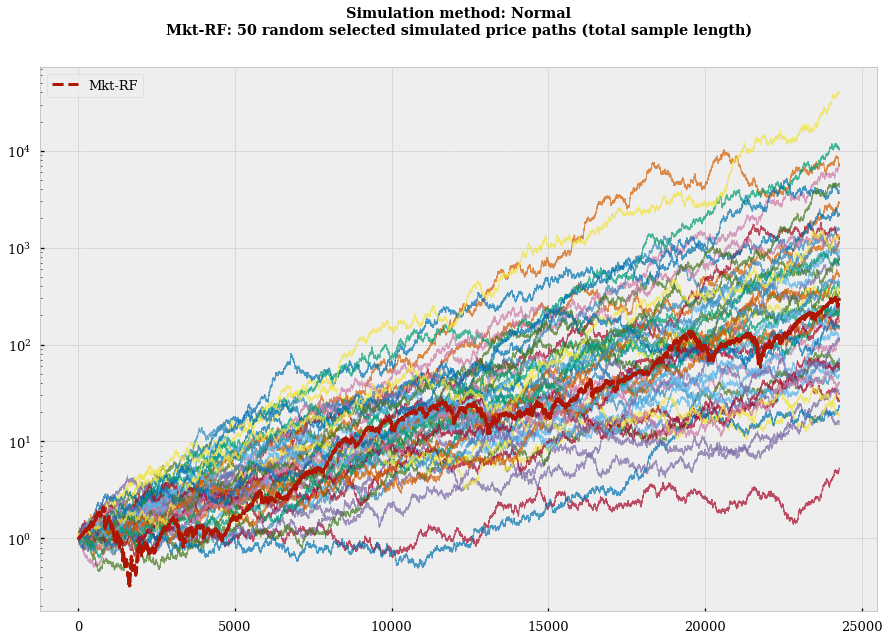

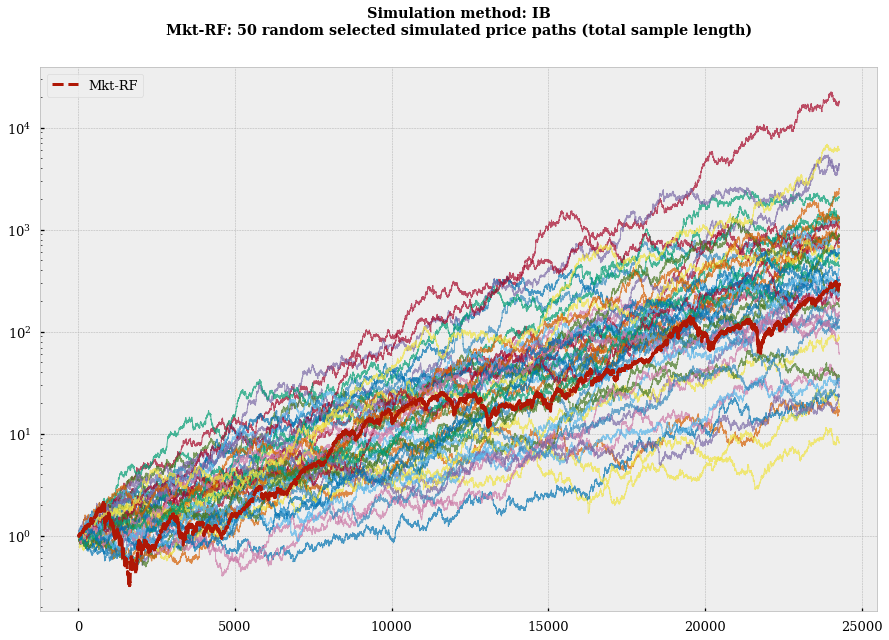

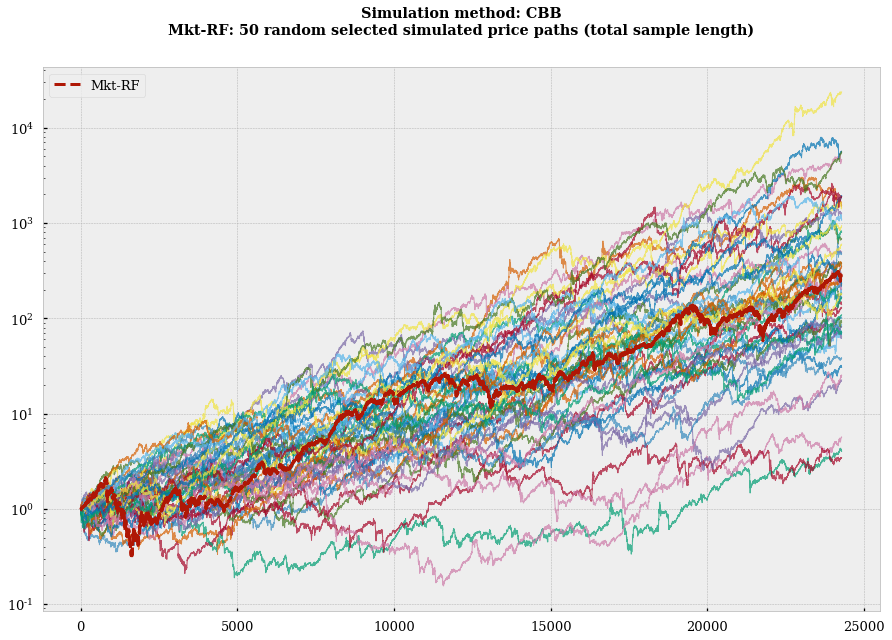

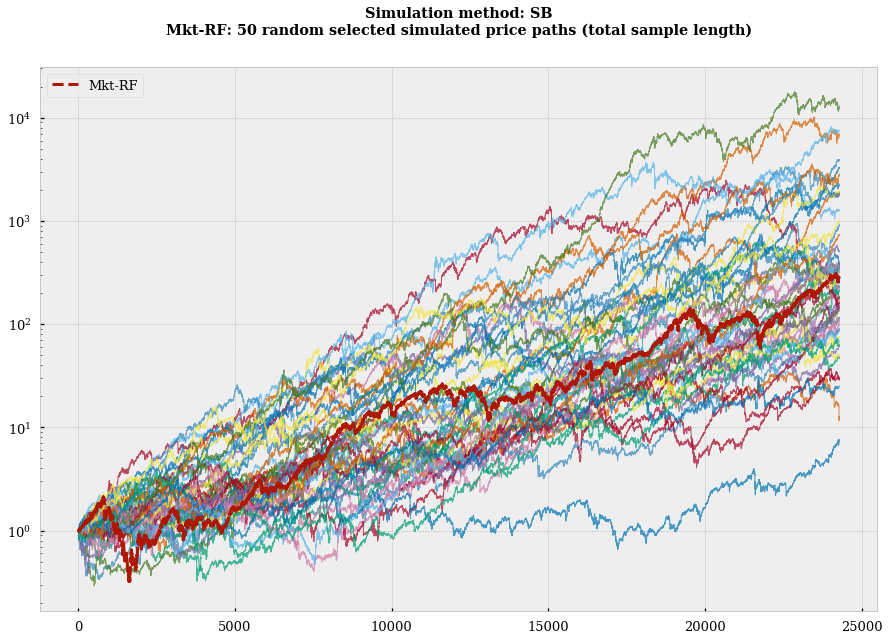

In [32]:
market_simulation = Simulation(data=df_factors.loc[:, "Mkt-RF"],
                               n_paths=N_PATHS,
                               blocksize=BLOCKSIZE,
                               stats=sum_stats,
                               perf_functions=perf_stats_dic,
                               investment_horizon=IH,
                               frequency=FREQUENCY,
                               plotting_1=plot_paths,
                               plotting_2=PLOT_INTERMEDIATE,
                               store_output=store_output_dic)

market_simulation.normal()
market_simulation.iid_bootstrap()
#market_simulation.mbb_bootstrap()
market_simulation.cbb_bootstrap()
market_simulation.sb_bootstrap()

In [33]:
market_simulation.store_output.keys()

dict_keys(['Mkt-RF'])

## Value (HML) <a id='3.2'></a>

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:07, 1336.23it/s]



CIRCULAR BOOTSTRAP 



10000it [00:07, 1344.96it/s]



STATIONARY BOOTSTRAP 



10000it [00:10, 943.24it/s]


<Figure size 432x288 with 0 Axes>

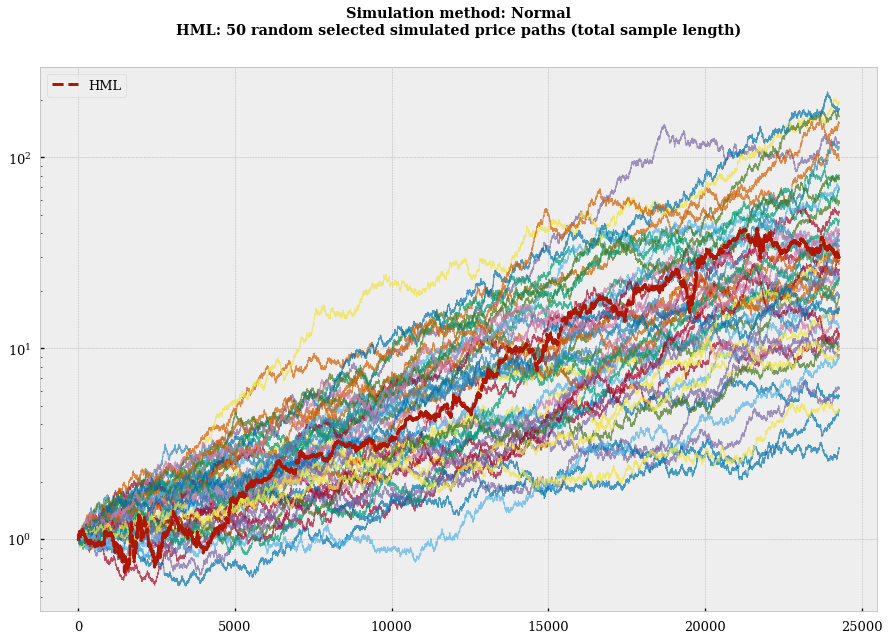

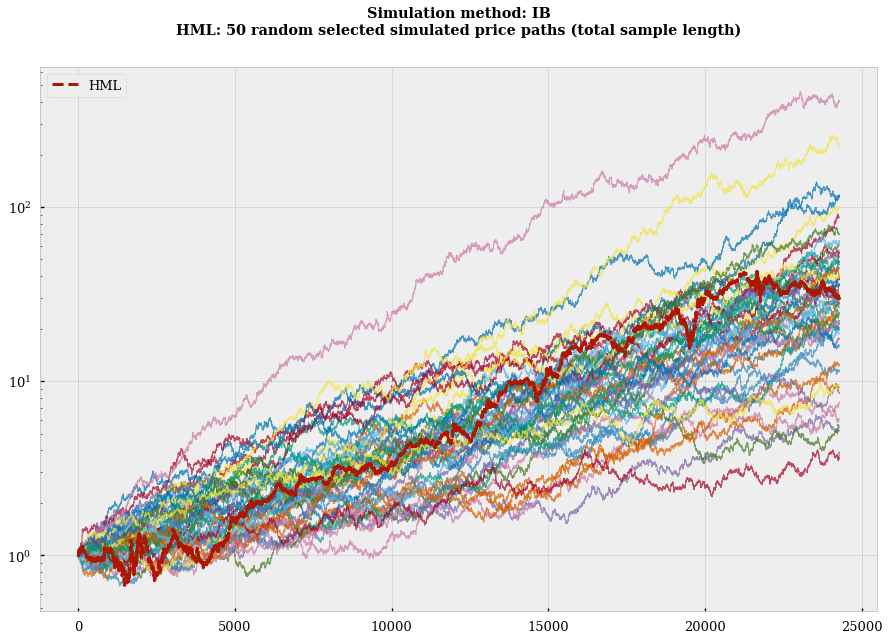

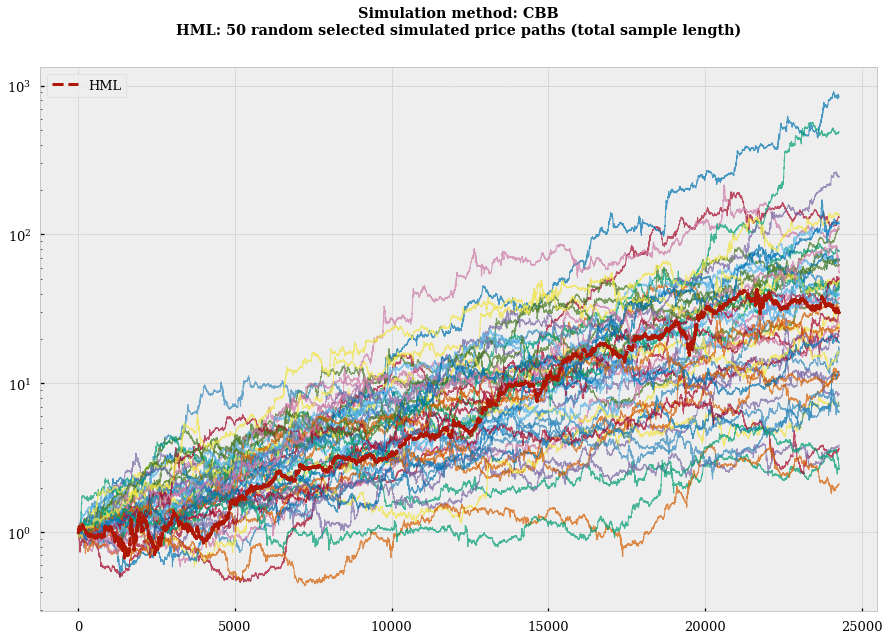

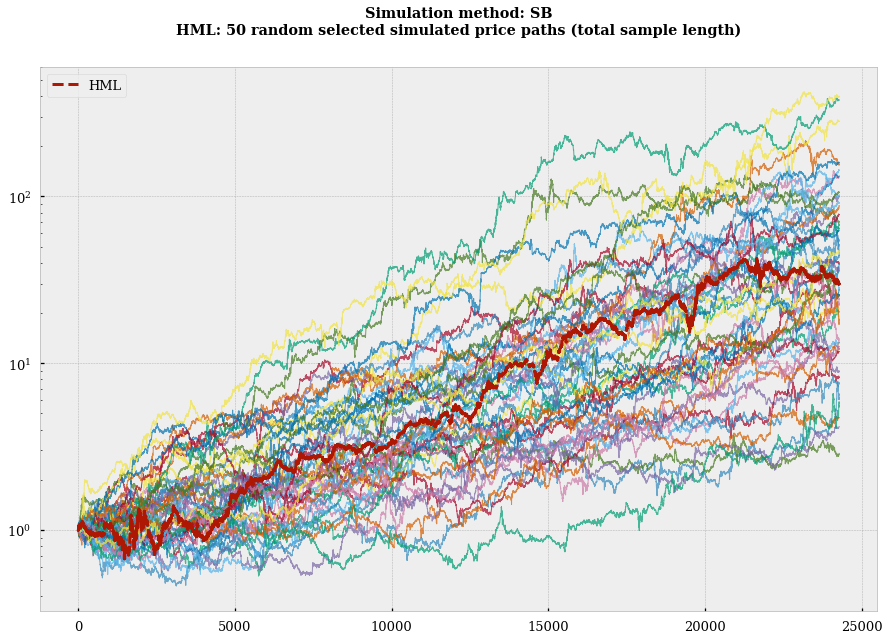

In [34]:
value_simulation = Simulation(data=df_factors.loc[:, "HML"],
                              n_paths=N_PATHS,
                              blocksize=BLOCKSIZE,
                              stats=sum_stats,
                              perf_functions=perf_stats_dic,
                              investment_horizon=IH,
                              frequency=FREQUENCY,
                              plotting_1=plot_paths,
                              plotting_2=PLOT_INTERMEDIATE,
                              store_output=store_output_dic)

value_simulation.normal()
value_simulation.iid_bootstrap()
# value_simulation.mbb_bootstrap()
value_simulation.cbb_bootstrap()
value_simulation.sb_bootstrap()

In [35]:
value_simulation.store_output.keys()

dict_keys(['Mkt-RF', 'HML'])

## Momentum (WML) <a id='3.3'></a>

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:09, 1001.80it/s]



CIRCULAR BOOTSTRAP 



10000it [00:08, 1126.97it/s]



STATIONARY BOOTSTRAP 



10000it [00:13, 754.67it/s]


<Figure size 432x288 with 0 Axes>

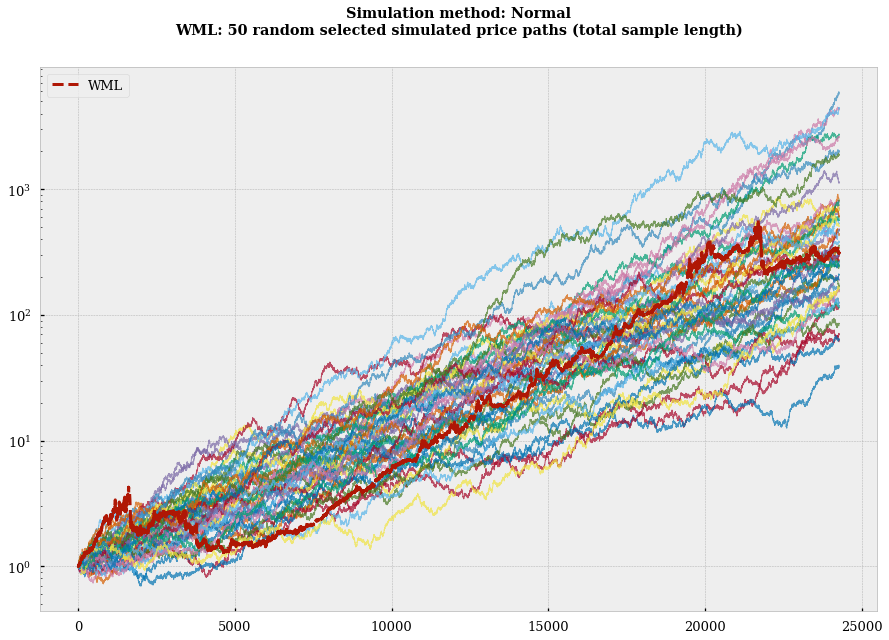

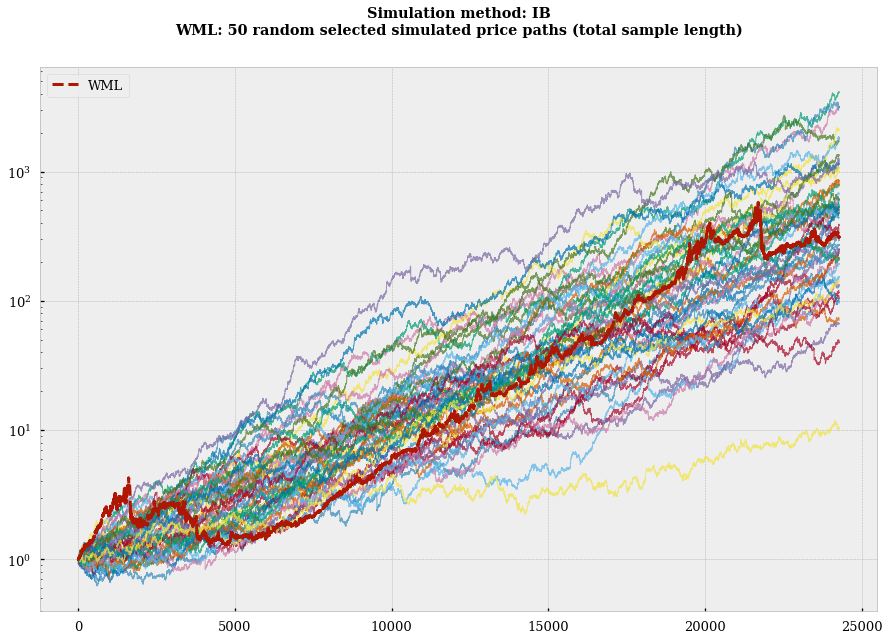

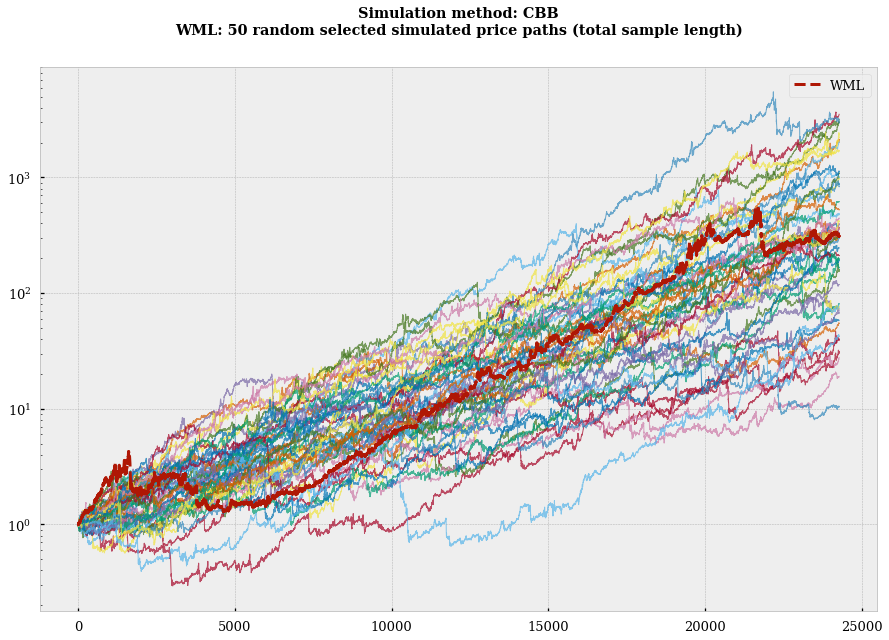

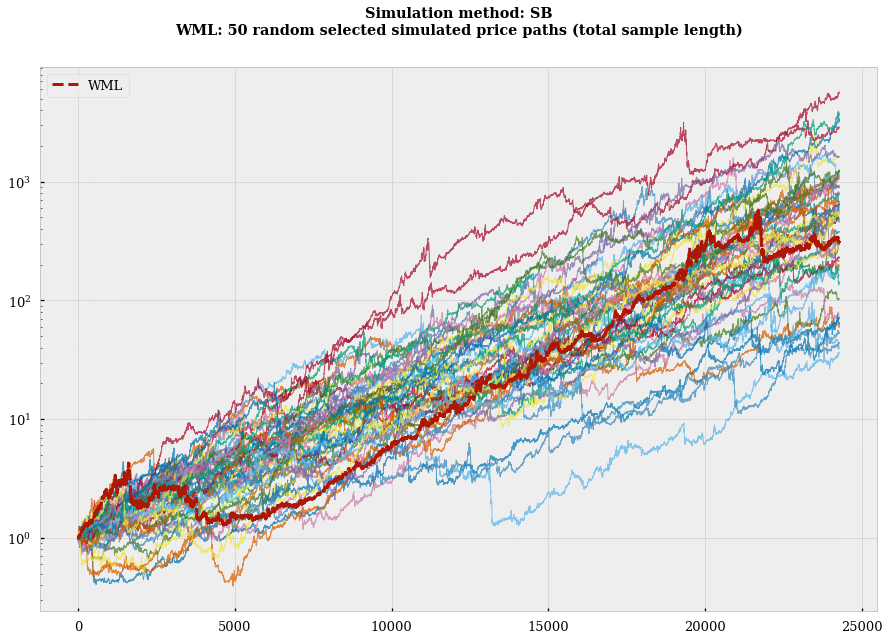

In [36]:
momentum_simulation = Simulation(data=df_factors.loc[:, "WML"],
                                 n_paths=N_PATHS,
                                 blocksize=BLOCKSIZE,
                                 stats=sum_stats,
                                 perf_functions=perf_stats_dic,
                                 investment_horizon=IH,
                                 frequency=FREQUENCY,
                                 plotting_1=plot_paths,
                                 plotting_2=PLOT_INTERMEDIATE,
                                 store_output=store_output_dic)

momentum_simulation.normal()
momentum_simulation.iid_bootstrap()
# momentum_simulation.mbb_bootstrap()
momentum_simulation.cbb_bootstrap()
momentum_simulation.sb_bootstrap()

In [37]:
momentum_simulation.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML'])

## 50-50 value-momentum <a id='3.4'></a>

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:10, 913.61it/s]



CIRCULAR BOOTSTRAP 



10000it [00:08, 1122.65it/s]



STATIONARY BOOTSTRAP 



10000it [00:14, 699.57it/s]


<Figure size 432x288 with 0 Axes>

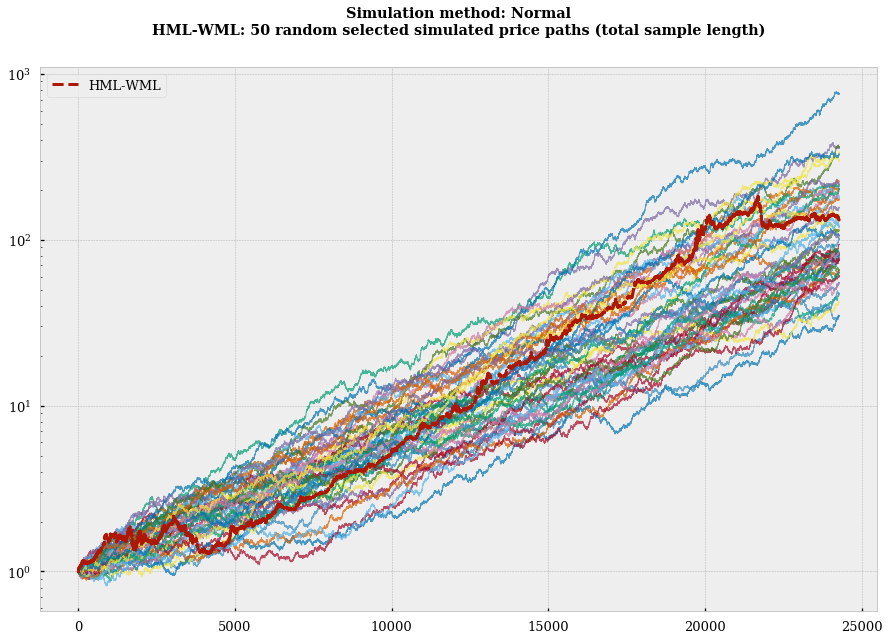

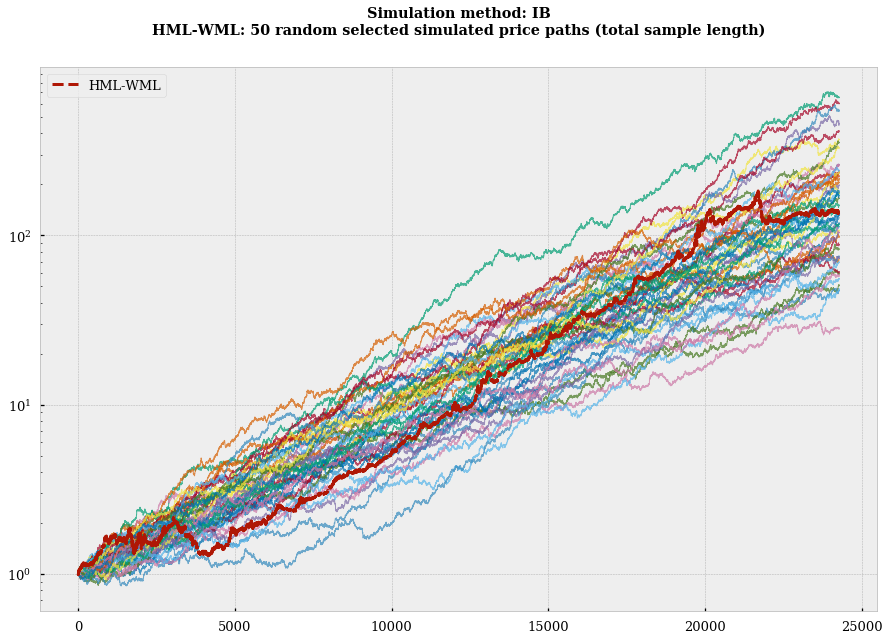

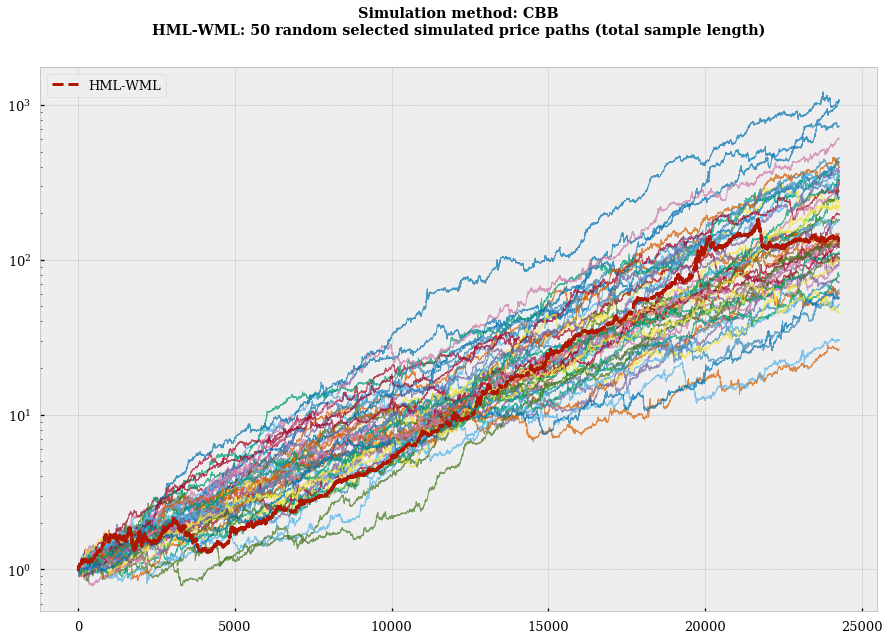

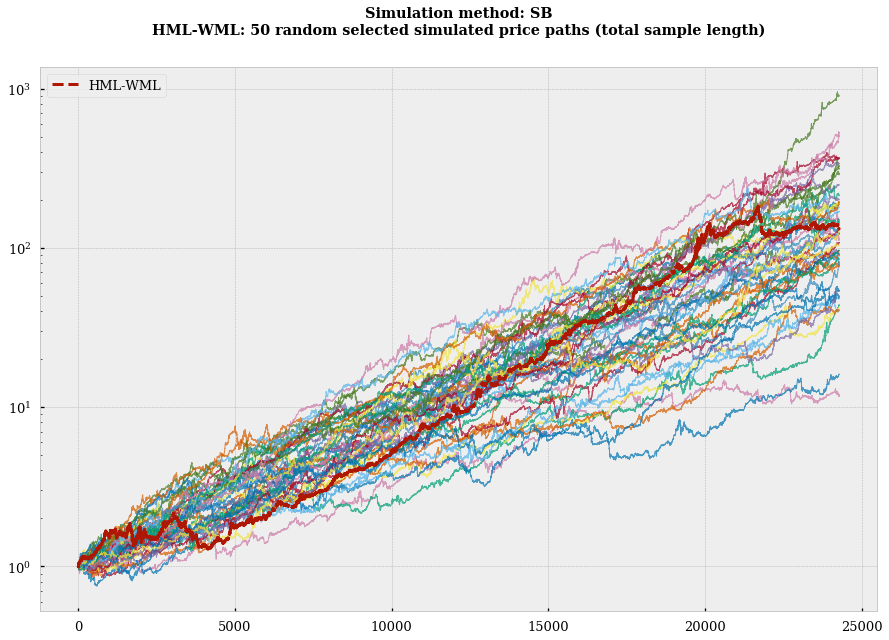

In [38]:
val_mom_simulation = Simulation(data=df_factors.loc[:, "HML-WML"],
                                n_paths=N_PATHS,
                                blocksize=BLOCKSIZE,
                                stats=sum_stats,
                                perf_functions=perf_stats_dic,
                                investment_horizon=IH,
                                frequency=FREQUENCY,
                                plotting_1=plot_paths,
                                plotting_2=PLOT_INTERMEDIATE,
                                store_output=store_output_dic)

val_mom_simulation.normal()
val_mom_simulation.iid_bootstrap()
# val_mom_simulation.mbb_bootstrap()
val_mom_simulation.cbb_bootstrap()
val_mom_simulation.sb_bootstrap()

In [39]:
val_mom_simulation.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML', 'HML-WML'])

## summarize results <a id='3.5'></a>

I will start by making some figures in order to summarizes the information efficiently. Next, I do the same thing numerically.


**Statistics:**
  
  - geometric return 
  - maximum drawdown
  - number of positive returns (based on the geometric return)

**Portfolios:**

 - Mkt-RF
 - HML
 - WML
 - HML-WML
 
**Simulation methods**

- normal
- iid bootstrapping
- cbb
- sb

**Investment horizons (year)**
- 1, 3, 5, 10, 20, 30

###  Visually

#### 1. Geometric return

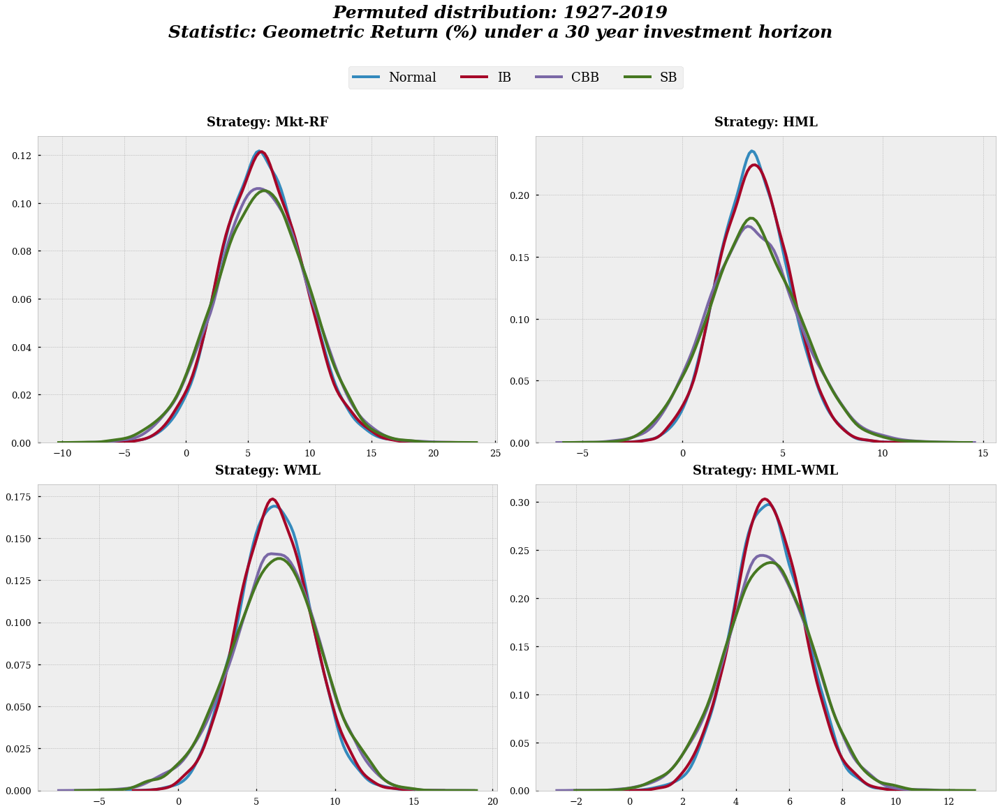

In [40]:
permutation_plot(dic=val_mom_simulation.store_output,
                 investment_h=30,
                 statistic='Geometric Return (%)',
                 period="1927-2019")

#### 2. Maximum Drawdown

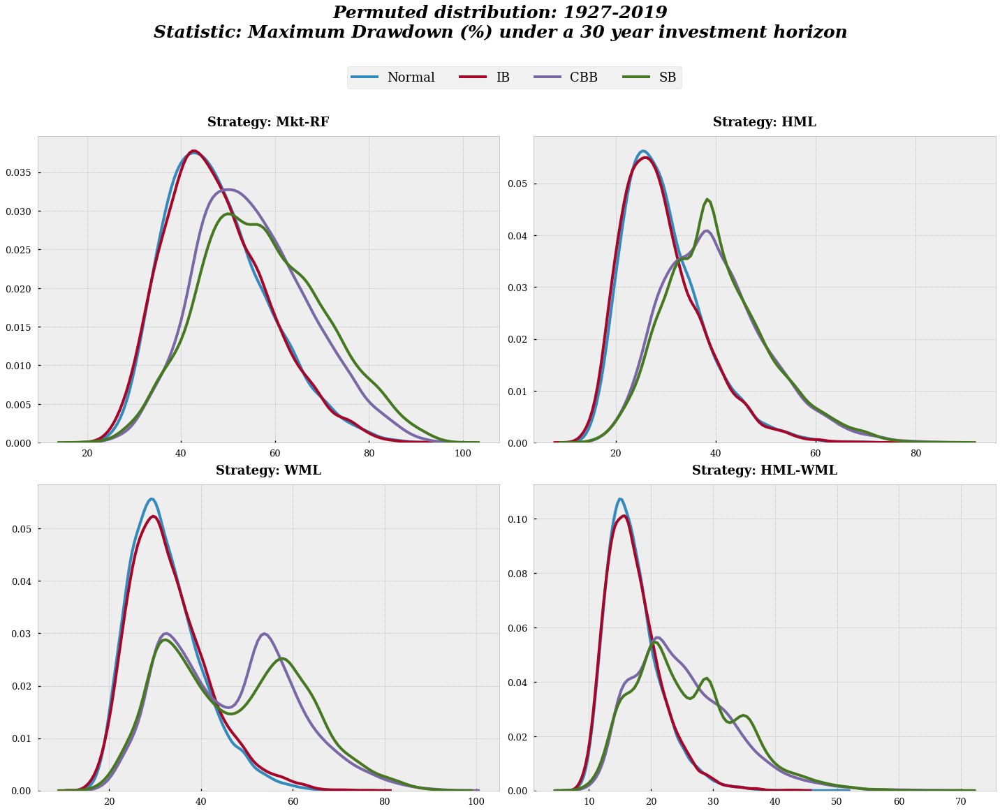

In [41]:
permutation_plot(dic=val_mom_simulation.store_output,
                 investment_h=30,
                 statistic='Maximum Drawdown (%)',
                 period="1927-2019")

In [42]:
statistic = "Geometric Return (%)"
df_stat = append_stats(stat=statistic, dic=val_mom_simulation.store_output)
df_stat.tail()

above_zero = df_stat.groupby(
    ["Strategy", "Investment Horizon (year)", "Simulation technique"],
    sort=False)[statistic].apply(lambda g: (g < 0).sum()).reset_index(
        name='count')
above_zero.head()

,Strategy,Investment Horizon (year),Simulation technique,count
0,Mkt-RF,1,Normal,3643
1,Mkt-RF,3,Normal,2717
2,Mkt-RF,5,Normal,2140
3,Mkt-RF,10,Normal,1339
4,Mkt-RF,20,Normal,551


#### 3. Positive return for different investment horizon (based on geometric return)

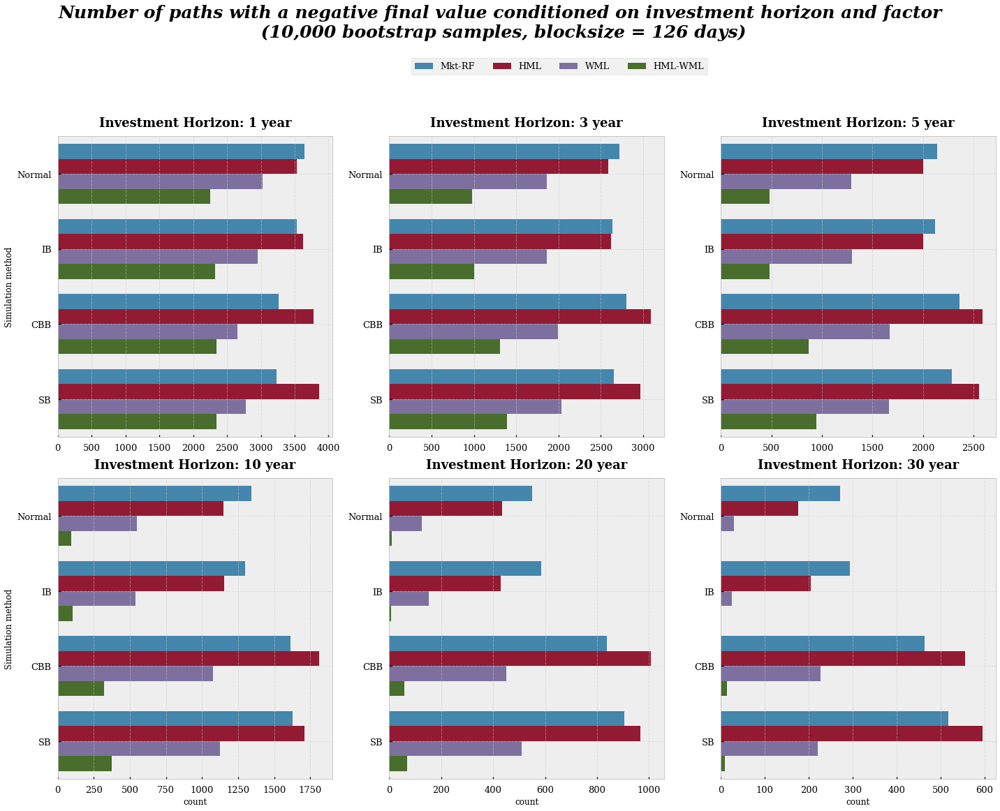

In [43]:
f, axes = plt.subplots(2, 3, figsize=(20, 14))
axes = axes.ravel()
i = 0
for h, h_df in above_zero.groupby("Investment Horizon (year)"):

    sns.barplot(y="Simulation technique",
                x="count",
                hue="Strategy",
                data=h_df,
                ax=axes[i])
    axes[i].get_legend().set_visible(False)  # remove legend
    axes[i].set_ylabel("Simulation method")
    axes[i].set_title(f'Investment Horizon: {h} year',
                      fontsize=18,
                      fontweight="bold",
                      y=1.02)
    axes[i].grid(True, which='major', linestyle='-.', color='0.8')
    i += 1
plt.suptitle(f"Number of paths with a negative\
 final value conditioned on investment horizon and factor\n ({N_PATHS :,}\
 bootstrap samples, blocksize = {BLOCKSIZE} days)",
             y=1.15,
             fontsize=25,
             fontweight="bold",
             style="italic")

# remove unnecessary labels
axes[1].set_ylabel("")
axes[2].set_ylabel("")
axes[4].set_ylabel("")
axes[5].set_ylabel("")
axes[0].set_xlabel("")
axes[1].set_xlabel("")
axes[2].set_xlabel("")
# set legend
plt.tight_layout()
axes[1].legend(bbox_to_anchor=(1.175, 1.275), ncol=4)

# save
plt.savefig('Positive_Return', bbox_inches='tight')

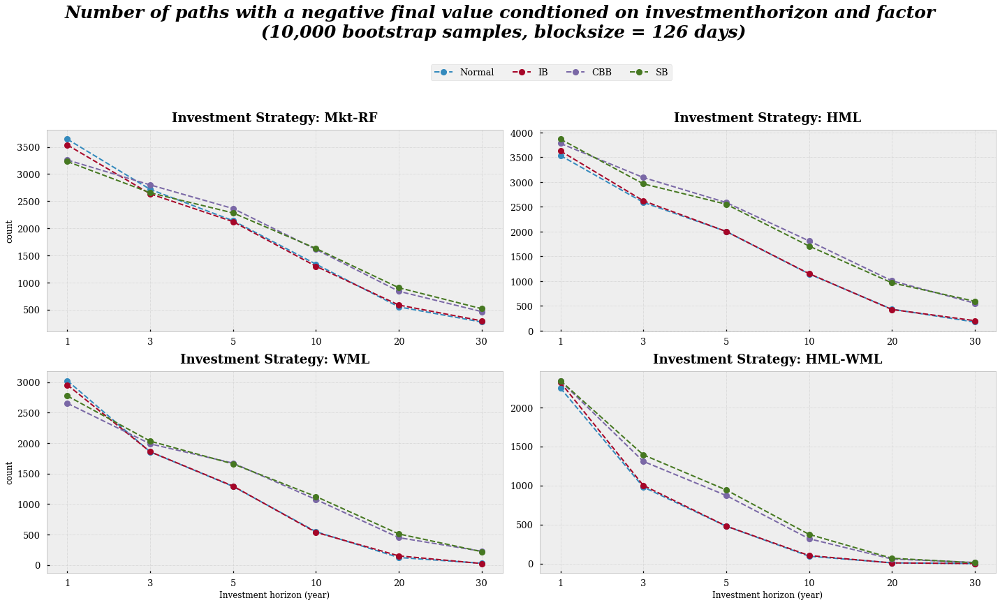

In [44]:
f, axes = plt.subplots(2, 2, figsize=(20, 10))
axes = axes.ravel()
i = 0
x = np.array([1, 2, 3, 4, 5, 6])
for s1, d1 in above_zero.groupby(["Strategy"], sort=False):
    for s2, d2 in d1.groupby("Simulation technique", sort=False):
        axes[i].plot(x, d2["count"], label=s2, linestyle='--', marker='o')

        axes[i].set_title(f'Investment Strategy: {s1}',
                          fontsize=18,
                          fontweight="bold",
                          y=1.02)
        axes[i].grid(True, which='major', linestyle='-.', color='0.8')

    axes[i].set_xticklabels(["1", "1", "3", "5", "10", "20", "30"])
    axes[i].set_xlabel("Investment horizon (year)")
    i += 1
axes[0].set_ylabel("count")
axes[0].set_xlabel("")
axes[2].set_ylabel("count")
axes[1].set_xlabel("")

plt.tight_layout()
axes[1].legend(bbox_to_anchor=(.3, 1.35), ncol=4)
plt.suptitle(
    f"Number of paths with a negative final value condtioned on investment\
horizon and factor\n ({N_PATHS :,} bootstrap samples, blocksize = {BLOCKSIZE} days)",
    y=1.2,
    fontsize=25,
    fontweight="bold",
    style="italic");
# save
#plt.savefig('Positive_Return_line', bbox_inches='tight')

###  Numeric Summary Tables

### Mkt-RF
   #### 1. Geometric return

In [45]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="Mkt-RF",
                       statistic="Geometric Return (%)",
                       sim_meth=["Normal", "IB", "CBB", "SB"],
                       nr_neg=True), 2)

Strategy and Statistic*              Mkt-RF : Geometric Return (%)        \
Descriptives                                                 count  mean   
Simulation method Investment Horizon                                       
Normal            1                                        10000.0  7.60   
                  3                                        10000.0  6.52   
                  5                                        10000.0  6.43   
                  10                                       10000.0  6.30   
                  20                                       10000.0  6.19   
                  30                                       10000.0  6.18   
IB                1                                        10000.0  7.94   
                  3                                        10000.0  6.81   
                  5                                        10000.0  6.58   
                  10                                       10000.0  6.38   
                  20                                       10000.0  6.19   
                  30                                       10000.0  6.16   
CBB               1                                        10000.0  8.20   
                  3                                        10000.0  6.71   
                  5                                        10000.0  6.43   
                  10                                       10000.0  6.25   
                  20                                       10000.0  6.17   
                  30                                       10000.0  6.18   
SB                1                                        10000.0  7.95   
                  3                                        10000.0  6.73   
                  5                                        10000.0  6.43   
                  10                                       10000.0  6.22   
                  20                                       10000.0  6.17   
                  30                                       10000.0  6.12   

Strategy and Statistic*                                                    \
Descriptives                            std    min     max kurtosis  skew   
Simulation method Investment Horizon                                        
Normal            1                   18.41 -40.79  103.90     0.34  0.44   
                  3                   10.37 -28.00   54.51     0.08  0.25   
                  5                    7.99 -18.23   42.76     0.02  0.22   
                  10                   5.68 -12.70   35.72     0.05  0.17   
                  20                   4.00  -7.83   21.69    -0.02  0.13   
                  30                   3.27  -5.27   19.54     0.02  0.09   
IB                1                   18.55 -49.58  101.23     0.53  0.50   
                  3                   10.51 -34.42   55.66     0.15  0.25   
                  5                    8.12 -24.95   43.87     0.08  0.21   
                  10                   5.70 -17.09   30.42     0.01  0.17   
                  20                   4.04  -6.94   22.45    -0.02  0.12   
                  30                   3.31  -4.08   21.04    -0.01  0.11   
CBB               1                   19.72 -62.22  134.47     2.06  0.41   
                  3                   11.64 -35.46   78.50     0.49  0.15   
                  5                    8.94 -30.53   51.19     0.18  0.05   
                  10                   6.33 -16.35   37.09     0.10  0.07   
                  20                   4.51 -11.24   23.87     0.05  0.07   
                  30                   3.68  -7.42   20.62     0.01  0.02   
SB                1                   19.56 -63.61  125.99     1.35  0.19   
                  3                   11.49 -39.08   58.03     0.32 -0.13   
                  5                    8.96 -34.48   38.80     0.19 -0.16   
                  10                   6.42 -27.05   29.18     0.19 -0.20   
                  20  

#### 2. Maximum Drawdown

In [46]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="Mkt-RF",
                       statistic="Maximum Drawdown (%)",
                       nr_neg=False), 2)

Strategy and Statistic*              Mkt-RF : Maximum Drawdown (%)         \
Descriptives                                                 count   mean   
Simulation method Investment Horizon                                        
Normal            1                                        10000.0  16.02   
                  3                                        10000.0  24.79   
                  5                                        10000.0  29.48   
                  10                                       10000.0  36.31   
                  20                                       10000.0  43.48   
                  30                                       10000.0  47.68   
IB                1                                        10000.0  15.33   
                  3                                        10000.0  24.08   
                  5                                        10000.0  28.91   
                  10                                       10000.0  35.95   
                  20                                       10000.0  43.30   
                  30                                       10000.0  47.60   
CBB               1                                        10000.0  16.11   
                  3                                        10000.0  27.44   
                  5                                        10000.0  33.59   
                  10                                       10000.0  42.25   
                  20                                       10000.0  50.75   
                  30                                       10000.0  55.36   
SB                1                                        10000.0  16.19   
                  3                                        10000.0  27.17   
                  5                                        10000.0  33.45   
                  10                                       10000.0  42.87   
                  20                                       10000.0  52.14   
                  30                                       10000.0  57.31   

Strategy and Statistic*                                                   \
Descriptives                            std    min    max kurtosis  skew   
Simulation method Investment Horizon                                       
Normal            1                    6.27   4.38  50.21     0.96  0.98   
                  3                    8.48   7.70  63.17     0.62  0.85   
                  5                    9.30  10.95  70.33     0.48  0.79   
                  10                  10.27  12.29  77.91     0.31  0.72   
                  20                  10.79  19.41  86.19     0.11  0.63   
                  30                  10.81  21.74  91.45     0.07  0.60   
IB                1                    6.35   3.23  51.06     1.11  1.01   
                  3                    8.52   6.49  72.91     0.97  0.90   
                  5                    9.41   9.40  77.00     0.57  0.81   
                  10                  10.43  13.31  85.46     0.39  0.72   
                  20                  10.88  17.99  90.79     0.14  0.61   
                  30                  10.89  21.53  92.32     0.01  0.54   
CBB               1                    9.94   2.43  68.62     1.37  1.27   
                  3                   12.33   5.55  75.40    -0.05  0.67   
                  5                   12.78   6.09  85.72    -0.13  0.54   
                  10                  12.86  11.25  87.82    -0.23  0.41   
                  20                  12.49  20.86  93.45    -0.19  0.37   
                  30                  11.99  23.15  96.56    -0.25  0.34   
SB                1                   10.10   1.76  65.68     1.77  1.36   
                  3                   13.13   5.32  80.09     0.30  0.84   
                  5                   13.84   6.43  89.02     0.03  0.67   
                  10                  14.36  10.08  96.71    -0.20  0.50   
                  20

### HML
   #### 1. Geometric return

In [47]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="HML",
                       statistic="Geometric Return (%)",
                       nr_neg=True), 2)

Strategy and Statistic*              HML : Geometric Return (%)               \
Descriptives                                              count  mean    std   
Simulation method Investment Horizon                                           
Normal            1                                     10000.0  4.02   9.58   
                  3                                     10000.0  3.74   5.56   
                  5                                     10000.0  3.63   4.27   
                  10                                    10000.0  3.59   3.00   
                  20                                    10000.0  3.58   2.14   
                  30                                    10000.0  3.57   1.74   
IB                1                                     10000.0  3.91   9.70   
                  3                                     10000.0  3.71   5.63   
                  5                                     10000.0  3.61   4.33   
                  10                                    10000.0  3.58   3.05   
                  20                                    10000.0  3.59   2.14   
                  30                                    10000.0  3.59   1.76   
CBB               1                                     10000.0  4.43  13.24   
                  3                                     10000.0  3.87   7.51   
                  5                                     10000.0  3.76   5.77   
                  10                                    10000.0  3.64   4.04   
                  20                                    10000.0  3.55   2.85   
                  30                                    10000.0  3.57   2.32   
SB                1                                     10000.0  4.24  12.82   
                  3                                     10000.0  3.92   7.27   
                  5                                     10000.0  3.83   5.67   
                  10                                    10000.0  3.70   3.98   
                  20                                    10000.0  3.62   2.81   
                  30                                    10000.0  3.58   2.29   

Strategy and Statistic*                                                      \
Descriptives                            min     max kurtosis  skew # neg. R   
Simulation method Investment Horizon                                          
Normal            1                  -27.57   43.77     0.02  0.26   3536.0   
                  3                  -14.33   25.68     0.03  0.19   2591.0   
                  5                  -10.91   22.03     0.05  0.15   2004.0   
                  10                  -8.07   15.83     0.04  0.08   1147.0   
                  20                  -5.12   13.12     0.04  0.07    435.0   
                  30                  -3.22   10.49     0.04  0.08    176.0   
IB                1                  -27.15   43.78     0.11  0.33   3628.0   
                  3                  -14.88   31.63     0.12  0.20   2623.0   
                  5                  -11.97   20.01     0.09  0.17   2004.0   
                  10                  -8.06   16.06     0.09  0.10   1153.0   
                  20                  -5.46   12.00     0.01  0.10    429.0   
                  30                  -3.79   10.66    -0.01  0.04    204.0   
CBB               1                  -43.48  104.82     3.15  0.96   3781.0   
                  3                  -19.92   50.45     0.97  0.49   3092.0   
                  5                  -15.56   31.46     0.56  0.36   2588.0   
                  10                 -10.76   20.62     0.34  0.27   1813.0   
                  20                  -7.19   15.25     0.29  0.19   1008.0   
                  30                  -5.12   13.43     0.16  0.19    556.0   
SB                1                  -35.32   99.87     2.84  0.89   3866.0   
                  3                  -21.84   44.45     0.62  0.37   2965.0   
                  5   

#### 2. Maximum Drawdown

In [48]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="HML",
                       statistic="Maximum Drawdown (%)",
                       nr_neg=False), 2)

Strategy and Statistic*              HML : Maximum Drawdown (%)                \
Descriptives                                              count   mean    std   
Simulation method Investment Horizon                                            
Normal            1                                     10000.0   9.06   3.66   
                  3                                     10000.0  14.36   5.27   
                  5                                     10000.0  17.34   6.01   
                  10                                    10000.0  21.92   7.09   
                  20                                    10000.0  26.68   7.79   
                  30                                    10000.0  29.62   7.96   
IB                1                                     10000.0   8.70   3.68   
                  3                                     10000.0  13.95   5.34   
                  5                                     10000.0  17.02   6.12   
                  10                                    10000.0  21.50   7.11   
                  20                                    10000.0  26.25   7.78   
                  30                                    10000.0  29.20   8.07   
CBB               1                                     10000.0  10.04   6.29   
                  3                                     10000.0  17.65   8.41   
                  5                                     10000.0  22.08   9.25   
                  10                                    10000.0  28.69   9.95   
                  20                                    10000.0  35.75  10.41   
                  30                                    10000.0  39.77  10.40   
SB                1                                     10000.0   9.90   6.25   
                  3                                     10000.0  17.29   8.65   
                  5                                     10000.0  21.86   9.56   
                  10                                    10000.0  28.73  10.21   
                  20                                    10000.0  35.97  10.41   
                  30                                    10000.0  40.18  10.34   

Strategy and Statistic*                                                   \
Descriptives                            min    max kurtosis  skew    1 %   
Simulation method Investment Horizon                                       
Normal            1                    2.42  29.98     1.02  1.00   3.53   
                  3                    4.72  42.53     1.07  0.98   6.28   
                  5                    5.64  48.28     1.13  0.99   7.95   
                  10                   7.47  63.74     1.37  1.03  10.73   
                  20                  10.29  68.88     1.32  1.00  14.28   
                  30                  13.23  71.35     1.16  0.95  16.63   
IB                1                    2.02  29.62     1.03  1.00   3.15   
                  3                    3.84  45.67     1.28  1.03   5.92   
                  5                    5.28  49.77     1.07  0.98   7.61   
                  10                   7.63  61.55     1.29  1.00  10.34   
                  20                  10.52  73.30     1.18  0.96  13.92   
                  30                  11.73  77.21     1.10  0.93  16.00   
CBB               1                    1.42  44.59     2.96  1.59   2.26   
                  3                    2.83  57.94     0.58  0.95   5.55   
                  5                    5.24  67.86     0.23  0.75   8.04   
                  10                   6.48  79.50     0.25  0.63  11.57   
                  20                  10.38  82.04     0.40  0.64  17.04   
                  30                  15.38  84.57     0.37  0.62  20.74   
SB                1                    1.15  47.12     3.29  1.65   2.11   
                  3                    2.35  60.74     0.47  0.97   5.06   
                  5                    3.79  65.12     0.04  0.7

### WML
   #### 1. Geometric return

In [49]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="WML",
                       statistic="Geometric Return (%)",
                       nr_neg=True), 2)

Strategy and Statistic*              WML : Geometric Return (%)               \
Descriptives                                              count  mean    std   
Simulation method Investment Horizon                                           
Normal            1                                     10000.0  6.92  12.58   
                  3                                     10000.0  6.34   7.11   
                  5                                     10000.0  6.24   5.53   
                  10                                    10000.0  6.15   3.92   
                  20                                    10000.0  6.14   2.80   
                  30                                    10000.0  6.15   2.28   
IB                1                                     10000.0  6.97  12.53   
                  3                                     10000.0  6.49   7.32   
                  5                                     10000.0  6.38   5.68   
                  10                                    10000.0  6.29   4.00   
                  20                                    10000.0  6.17   2.84   
                  30                                    10000.0  6.17   2.32   
CBB               1                                     10000.0  7.18  14.63   
                  3                                     10000.0  6.37   8.86   
                  5                                     10000.0  6.25   6.95   
                  10                                    10000.0  6.17   4.93   
                  20                                    10000.0  6.16   3.50   
                  30                                    10000.0  6.16   2.86   
SB                1                                     10000.0  7.03  15.10   
                  3                                     10000.0  6.40   9.04   
                  5                                     10000.0  6.32   7.11   
                  10                                    10000.0  6.24   5.09   
                  20                                    10000.0  6.17   3.57   
                  30                                    10000.0  6.15   2.90   

Strategy and Statistic*                                                      \
Descriptives                            min     max kurtosis  skew # neg. R   
Simulation method Investment Horizon                                          
Normal            1                  -29.74   81.83     0.27  0.34   3026.0   
                  3                  -15.73   33.94     0.03  0.20   1858.0   
                  5                  -14.00   29.51     0.01  0.17   1290.0   
                  10                  -9.01   21.00     0.00  0.12    548.0   
                  20                  -3.82   17.00     0.02  0.08    124.0   
                  30                  -2.15   15.72    -0.00  0.05     30.0   
IB                1                  -30.83   66.93     0.18  0.27   2957.0   
                  3                  -21.59   38.36     0.14  0.16   1859.0   
                  5                  -15.03   30.50     0.15  0.10   1296.0   
                  10                  -9.59   22.56     0.05  0.08    537.0   
                  20                  -4.13   17.75     0.02  0.03    151.0   
                  30                  -1.68   15.74    -0.03  0.06     25.0   
CBB               1                  -61.28  100.41     2.68 -0.28   2655.0   
                  3                  -45.72   41.14     1.09 -0.42   1989.0   
                  5                  -29.81   31.33     0.61 -0.34   1673.0   
                  10                 -15.24   23.44     0.27 -0.27   1076.0   
                  20                  -7.86   20.35     0.15 -0.20    450.0   
                  30                  -6.19   17.41     0.17 -0.19    227.0   
SB                1                  -65.24   88.98     1.95 -0.27   2776.0   
                  3                  -39.24   40.43     0.97 -0.46   2034.0   
                  5   

#### 2. Maximum Drawdown

In [50]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="WML",
                       statistic="Maximum Drawdown (%)",
                       nr_neg=False), 2)

Strategy and Statistic*              WML : Maximum Drawdown (%)                \
Descriptives                                              count   mean    std   
Simulation method Investment Horizon                                            
Normal            1                                     10000.0  11.01   4.39   
                  3                                     10000.0  16.91   5.91   
                  5                                     10000.0  20.06   6.61   
                  10                                    10000.0  24.75   7.43   
                  20                                    10000.0  29.52   7.85   
                  30                                    10000.0  32.36   7.95   
IB                1                                     10000.0  10.65   4.69   
                  3                                     10000.0  16.72   6.47   
                  5                                     10000.0  20.09   7.21   
                  10                                    10000.0  24.96   7.93   
                  20                                    10000.0  30.13   8.49   
                  30                                    10000.0  33.06   8.55   
CBB               1                                     10000.0  12.41   9.08   
                  3                                     10000.0  21.35  11.74   
                  5                                     10000.0  26.35  12.67   
                  10                                    10000.0  33.71  13.80   
                  20                                    10000.0  41.58  14.16   
                  30                                    10000.0  46.62  13.90   
SB                1                                     10000.0  12.64   9.12   
                  3                                     10000.0  21.09  12.05   
                  5                                     10000.0  25.92  13.22   
                  10                                    10000.0  33.52  14.60   
                  20                                    10000.0  42.01  15.16   
                  30                                    10000.0  47.28  14.79   

Strategy and Statistic*                                                   \
Descriptives                            min    max kurtosis  skew    1 %   
Simulation method Investment Horizon                                       
Normal            1                    3.38  35.49     1.23  1.06   4.46   
                  3                    5.55  44.58     1.00  0.98   7.91   
                  5                    6.37  56.37     1.08  0.96   9.78   
                  10                   9.74  63.37     1.13  0.96  12.95   
                  20                  12.77  72.60     1.06  0.91  16.64   
                  30                  14.98  72.60     0.76  0.83  19.11   
IB                1                    2.53  38.78     1.73  1.19   3.85   
                  3                    5.32  56.54     1.41  1.08   7.06   
                  5                    5.81  59.27     1.35  1.04   9.11   
                  10                   8.81  65.66     1.27  0.98  12.33   
                  20                  10.64  77.14     1.06  0.92  16.14   
                  30                  14.82  77.14     0.90  0.87  18.59   
CBB               1                    1.33  63.93     6.08  2.14   2.68   
                  3                    3.65  84.61     2.23  1.46   5.93   
                  5                    5.51  85.49     1.17  1.20   8.49   
                  10                   9.62  85.49     0.09  0.89  13.61   
                  20                  14.25  90.39    -0.58  0.52  19.38   
                  30                  17.65  93.48    -0.63  0.32  23.05   
SB                1                    1.70  66.29     6.14  2.12   2.63   
                  3                    3.80  81.19     2.75  1.57   5.68   
                  5                    5.15  83.01     1.57  1.3

### HML-WML
   #### 1. Geometric return

In [51]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="HML-WML",
                       statistic="Geometric Return (%)",
                       nr_neg=True), 2)

Strategy and Statistic*              HML-WML : Geometric Return (%)        \
Descriptives                                                  count  mean   
Simulation method Investment Horizon                                        
Normal            1                                         10000.0  5.50   
                  3                                         10000.0  5.30   
                  5                                         10000.0  5.29   
                  10                                        10000.0  5.26   
                  20                                        10000.0  5.25   
                  30                                        10000.0  5.22   
IB                1                                         10000.0  5.45   
                  3                                         10000.0  5.33   
                  5                                         10000.0  5.26   
                  10                                        10000.0  5.24   
                  20                                        10000.0  5.22   
                  30                                        10000.0  5.21   
CBB               1                                         10000.0  5.55   
                  3                                         10000.0  5.33   
                  5                                         10000.0  5.33   
                  10                                        10000.0  5.28   
                  20                                        10000.0  5.25   
                  30                                        10000.0  5.22   
SB                1                                         10000.0  5.35   
                  3                                         10000.0  5.23   
                  5                                         10000.0  5.23   
                  10                                        10000.0  5.21   
                  20                                        10000.0  5.21   
                  30                                        10000.0  5.23   

Strategy and Statistic*                                                  \
Descriptives                           std    min    max kurtosis  skew   
Simulation method Investment Horizon                                      
Normal            1                   7.22 -18.55  37.18     0.11  0.20   
                  3                   4.16  -9.61  21.63     0.01  0.13   
                  5                   3.25  -5.86  17.01    -0.02  0.12   
                  10                  2.29  -2.94  13.90     0.00  0.05   
                  20                  1.64  -1.05  11.39     0.02  0.02   
                  30                  1.32   0.55  10.64     0.05  0.02   
IB                1                   7.29 -21.22  37.66     0.19  0.19   
                  3                   4.19  -9.28  22.53     0.02  0.12   
                  5                   3.23  -6.81  17.51     0.02  0.08   
                  10                  2.31  -3.45  16.18     0.03  0.05   
                  20                  1.63  -1.11  11.21     0.01  0.02   
                  30                  1.32   0.42  10.38     0.02  0.03   
CBB               1                   8.93 -39.65  52.04     1.65  0.05   
                  3                   5.05 -21.90  26.78     0.79 -0.12   
                  5                   3.97 -15.24  22.76     0.40 -0.07   
                  10                  2.82  -8.09  16.70     0.32 -0.06   
                  20                  1.99  -2.84  12.44     0.20 -0.05   
                  30                  1.63  -1.91  11.38     0.16 -0.08   
SB                1                   8.66 -33.47  44.50     1.39 -0.01   
                  3                   5.14 -17.76  27.26     0.67 -0.09   
                  5                   4.00 -10.37  24.00     0.45 -0.11   
                  10                  2.86  -5.89  16.23     0.19 -0.07   
                  20                  2.02  -

#### 2. Maximum Drawdown

In [52]:
round(
    performance_matrix(dic=val_mom_simulation.store_output,
                       strategy="HML-WML",
                       statistic="Maximum Drawdown (%)",
                       nr_neg=False), 2)

Strategy and Statistic*              HML-WML : Maximum Drawdown (%)         \
Descriptives                                                  count   mean   
Simulation method Investment Horizon                                         
Normal            1                                         10000.0   6.10   
                  3                                         10000.0   9.22   
                  5                                         10000.0  10.86   
                  10                                        10000.0  13.21   
                  20                                        10000.0  15.68   
                  30                                        10000.0  17.18   
IB                1                                         10000.0   5.97   
                  3                                         10000.0   9.12   
                  5                                         10000.0  10.80   
                  10                                        10000.0  13.21   
                  20                                        10000.0  15.75   
                  30                                        10000.0  17.23   
CBB               1                                         10000.0   6.89   
                  3                                         10000.0  11.56   
                  5                                         10000.0  14.15   
                  10                                        10000.0  18.07   
                  20                                        10000.0  22.42   
                  30                                        10000.0  25.08   
SB                1                                         10000.0   6.82   
                  3                                         10000.0  11.44   
                  5                                         10000.0  14.10   
                  10                                        10000.0  18.29   
                  20                                        10000.0  22.95   
                  30                                        10000.0  25.74   

Strategy and Statistic*                                                        \
Descriptives                           std   min    max kurtosis  skew    1 %   
Simulation method Investment Horizon                                            
Normal            1                   2.44  1.72  21.21     2.09  1.21   2.54   
                  3                   3.30  3.11  28.40     1.85  1.16   4.33   
                  5                   3.66  4.06  32.39     1.96  1.18   5.39   
                  10                  4.00  5.47  38.18     2.08  1.18   7.06   
                  20                  4.28  6.82  42.81     1.94  1.12   8.96   
                  30                  4.35  7.88  49.92     1.92  1.09  10.18   
IB                1                   2.60  1.23  22.60     2.23  1.25   2.19   
                  3                   3.44  2.66  28.75     1.95  1.19   3.98   
                  5                   3.80  3.61  34.58     2.01  1.18   5.05   
                  10                  4.19  4.45  40.60     2.15  1.18   6.78   
                  20                  4.42  6.79  43.59     2.12  1.13   8.73   
                  30                  4.44  8.12  43.63     1.79  1.05   9.94   
CBB               1                   4.75  0.60  41.05     5.56  2.02   1.52   
                  3                   6.16  2.11  58.21     3.62  1.61   3.63   
                  5                   6.71  2.77  58.21     2.35  1.37   4.92   
                  10                  7.34  5.12  63.69     1.61  1.17   7.35   
                  20                  7.86  7.40  63.69     0.97  0.96  10.31   
                  30                  7.97  8.90  66.16     0.94  0.86  12.50   
SB                1                   4.69  0.74  37.08     6.21  2.07   1.52   
                  3                   6.40  1.89  47.83     2.89  1.59   3.28   
                  5           

There is a clear distinction between the distributions depending on the simulation assumptions:

 - the normal and i.i.d. bootstrap are similar
 - and the circular block bootstrap and stationary bootstrap are more alike
 
IMO the circular and stationary bootstrap givs a far more  realistic picture about expectations, since they (try to) preserve the non-normality and serial correlations. One limitation of the circular block bootstrap is the fixed block size. Different block sizes emphasize different periods or lengths of autocorrelation (memory). At the extremes you can take a block size so small (i.i.d. bootstrap) that no serial correlation is captured, and at the other end you could take a block size so large that you end up sampling the original series. However, in my initial experimentation there are many reasonable block sizes that generate realistic price paths, that overall capture the behavior of the original series. I guess this is also why results of the circular block bootstrap are very close to those obtained from the stationary bootstrap. 


**Geometric Return** 

Perhaps most interesting are the **frequencies of negative returns (# neg. R) for different factors under a investment horizon ranging from 1 year to 30 years**.
When evaluating portfolio performance, professional investors often put much weight on three or five years of past returns. The message from the results above is that chance is a big player in outcomes for these horizons. In the simulations, the expected premiums are more or less equal to their sample averages. Negative simulated premiums are then just chance results of high return volatility. By definition the variance will shrink as you increase the investor horizon, the question remains how fast?

As an example, **For a five-year investment horizon**, the estimated probabilities that a **value strategy** delivers a negative premium on a purely chance basis are substantial, ranging between 20-26% depending on the simulation assumptions. The estimated frequencies of negative premiums are bigger at shorter investment horiozns, even though we know that, by construction, the expected premiums are positive and large. For longer investment horizons the negative premium becomes less likely but still substantial for 10-year periods and they are also nontrivial for 20-year periods. 

**Maximum Drawdown**

 
The main message when looking at drawdowns is two-fold. First, it shows that value of and momentum strategies like the market also suffers large drawdowns. Moreover, if we falsely view returns as being well approximated by independent normal distributions, you would severely underestimate the magnitude of the worst likely drawdowns. Second,  if we account for the serial correlation structures, the observed large drawdowns are not that surprising at all. 

<a id='Chapter4'></a>
# Chapter: 4 Simulation Analysis Part 2

## Recent poor performance of the Momentum and Value factor 

The figure below shows that value and momentum factor did not deliver much return
in the **last 15 years (01-01-2004 to 28-02-2019)**. Are these factors broken or just experiencing a period of bad luck? To answer this question, I examine the role of bad luck in explaining the recent poor performance of factors. I start with measuring the performance of each factor over the last 15 years
ending February 2019 and use simulations to assess the likelihood of observing this level of
performance, given how the factors performed before these recent years. I compare factor performance from **January 2004** through **February 2019** to performance from:
 - **July 1963 through December 2003**. 
 - **January 1927 through December 2003**
 
Similar as in Chapter 3, I then simulate returns under different assumptions to assess which features of factor returns, if any, can account for their poor recent performance. Some Papers **only include data starting from 1963** because they argue that the period before is not representative anymore due to higher volatility. Therefore, I will analyze both periods separately and look whether there are notable differences. **The number of simulations is set at 10,000. and the blocksize and mean blocksize are both 126 days**. Finally, the bootstrap samples where I calculate the statistic of interest on are based on an investment horizon of 15 years.


### Helper functions
 - `p_values:`calculates the p-values
 - `p_table:`appends the p-values for different statistics , investment horizons, 
    strategies and simulation methods in a table

### Performance over the last recent 15 years

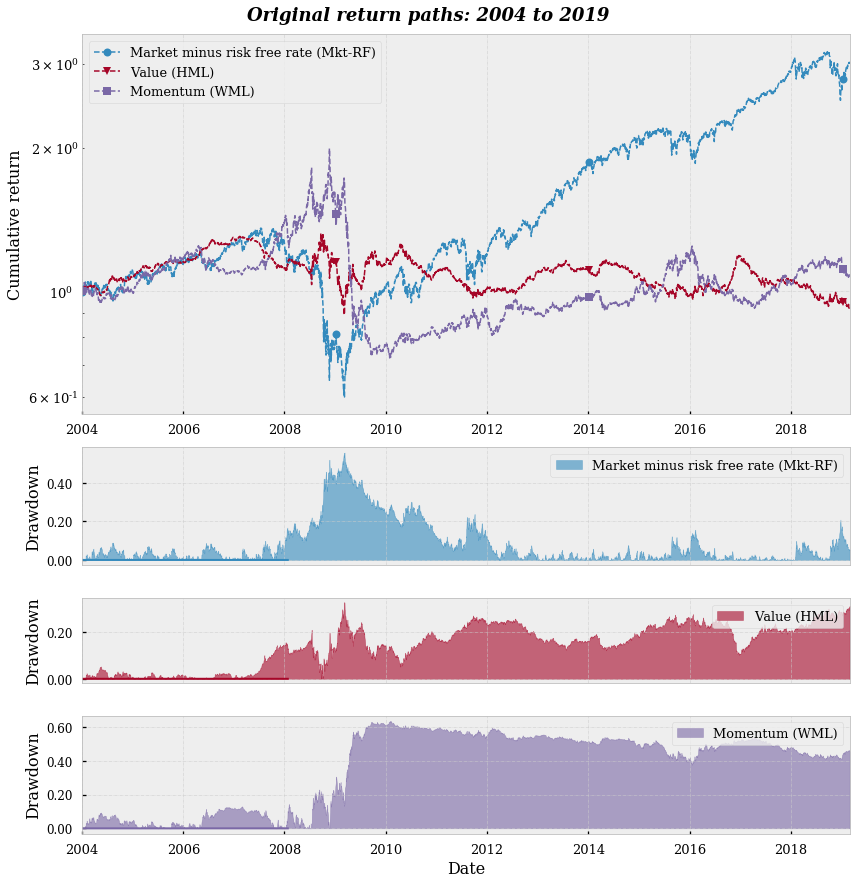

In [53]:
start = datetime.date(year=2004, month=1, day=1)
df_15 = df_factors.loc[start:]
Return_DD(df=df_15, dic_labels=dic_fac, time_frequency=FREQUENCY)

In [54]:
print(round(df_15.describe(), 3))
obs_15 = round(perf_stat(df_15, stats="all", dic_perf=perf_stats_dic), 3)
obs_15

         Mkt-RF       HML       WML   HML-WML
count  3815.000  3815.000  3815.000  3815.000
mean      0.036    -0.000     0.006     0.003
std       1.160     0.626     0.922     0.397
min      -8.950    -4.220    -8.210    -2.455
25%      -0.410    -0.280    -0.360    -0.195
50%       0.070    -0.010     0.050     0.020
75%       0.540     0.255     0.430     0.220
max      11.350     4.830     7.010     2.485


,Mkt-RF,HML,WML,HML-WML
Skew,-0.176,0.634,-0.807,-0.408
Kurtosis,10.640,10.809,11.158,3.704
Terminal Wealth Relative,2.014,-0.086,0.085,0.089
Arithmetric Return (%),8.986,-0.099,1.619,0.760
Geometric Return (%),7.560,-0.590,0.543,0.562
Arithmetric Volatility (%),18.410,9.936,14.642,6.307
Geometric Volatility (%),18.542,9.948,14.769,6.324
Arithmetric SR,0.488,-0.010,0.111,0.120
Geometric SR,0.408,-0.059,0.037,0.089
Maximum Drawdown (%),55.814,32.576,63.705,36.195


### Performance  before the last 15 years starting from 1963

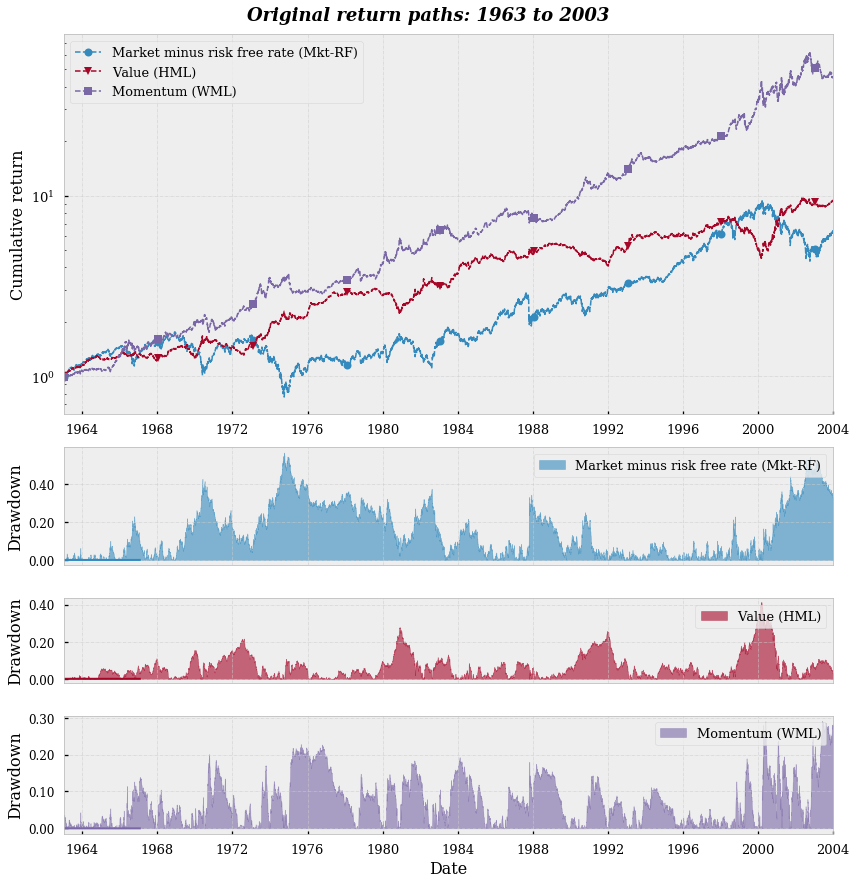

In [55]:
start, end = datetime.date(year=1963, month=1, day=1), datetime.date(year=2004,
                                                                     month=1,
                                                                     day=1)
df_before_15_63 = df_factors.loc[start:end]
Return_DD(df=df_before_15_63, dic_labels=dic_fac, time_frequency=FREQUENCY)

### Performance  before the last 15 years starting from 1927 (all data)

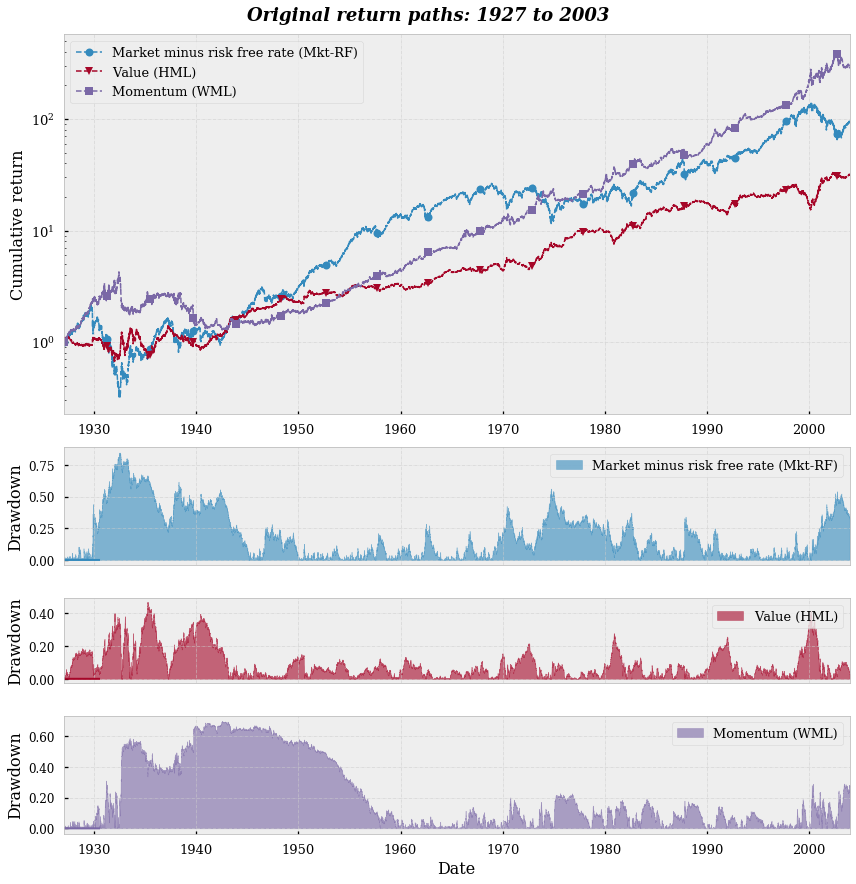

In [56]:
start, end = datetime.date(year=1927, month=1, day=1), datetime.date(year=2004,
                                                                     month=1,
                                                                     day=1)
df_before_15_27 = df_factors.loc[start:end]
Return_DD(df=df_before_15_27, dic_labels=dic_fac,time_frequency=FREQUENCY)

In [57]:
perf_stats_dic.keys()

dict_keys(['Skew', 'Kurtosis', 'Terminal Wealth Relative', 'Arithmetric Return (%)', 'Geometric Return (%)', 'Arithmetric Volatility (%)', 'Geometric Volatility (%)', 'Arithmetric SR', 'Geometric SR', 'Maximum Drawdown (%)', 'Underwater (%)', '(%) Underwater >20 %'])

In [58]:
sum_stats = ['Geometric Return (%)', 'Maximum Drawdown (%)', 'Geometric SR']
investment_horizon = [15]  # in years
plot_paths = False # to keep the size of the notebook mangeable
# store all the output in a dictionary
store_output_dic_63, store_output_dic_27 = {}, {}

## Simulation Period: 01-01-1963 till 31-12-2003 <a id='4.1'></a>
###  Market <a id='4.1.1'></a>

In [59]:
market_simulation_15_63 = Simulation(data=df_before_15_63.loc[:, "Mkt-RF"],
                                     n_paths=N_PATHS,
                                     blocksize=BLOCKSIZE,
                                     stats=sum_stats,
                                     perf_functions=perf_stats_dic,
                                     investment_horizon=investment_horizon,
                                     frequency=FREQUENCY,
                                     plotting_1=plot_paths,
                                     plotting_2=PLOT_INTERMEDIATE,
                                     store_output=store_output_dic_63)

market_simulation_15_63.normal()
market_simulation_15_63.iid_bootstrap()
market_simulation_15_63.cbb_bootstrap()
market_simulation_15_63.sb_bootstrap()

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:08, 1229.21it/s]



CIRCULAR BOOTSTRAP 



10000it [00:05, 1805.27it/s]



STATIONARY BOOTSTRAP 



10000it [00:09, 1011.81it/s]


In [60]:
market_simulation_15_63.store_output.keys()

dict_keys(['Mkt-RF'])

### Value (HML) <a id='4.1.2'></a>

In [61]:
value_simulation_15_63 = Simulation(data=df_before_15_63.loc[:, "HML"],
                                     n_paths=N_PATHS,
                                     blocksize=BLOCKSIZE,
                                     stats=sum_stats,
                                     perf_functions=perf_stats_dic,
                                     investment_horizon=investment_horizon,
                                     frequency=FREQUENCY,
                                     plotting_1=plot_paths,
                                     plotting_2=PLOT_INTERMEDIATE,
                                     store_output=store_output_dic_63)

value_simulation_15_63.normal()
value_simulation_15_63.iid_bootstrap()
value_simulation_15_63.cbb_bootstrap()
value_simulation_15_63.sb_bootstrap()

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:06, 1621.45it/s]



CIRCULAR BOOTSTRAP 



10000it [00:06, 1520.12it/s]



STATIONARY BOOTSTRAP 



10000it [00:08, 1185.83it/s]


In [62]:
value_simulation_15_63.store_output.keys()

dict_keys(['Mkt-RF', 'HML'])

###  Momentum (WML) <a id='4.1.3'></a>

In [63]:
momentum_simulation_15_63 = Simulation(data=df_before_15_63.loc[:, "WML"],
                                       n_paths=N_PATHS,
                                       blocksize=BLOCKSIZE,
                                       stats=sum_stats,
                                       perf_functions=perf_stats_dic,
                                       investment_horizon=investment_horizon,
                                       frequency=FREQUENCY,
                                       plotting_1=plot_paths,
                                       plotting_2=PLOT_INTERMEDIATE,
                                       store_output=store_output_dic_63)

momentum_simulation_15_63.normal()
momentum_simulation_15_63.iid_bootstrap()
momentum_simulation_15_63.cbb_bootstrap()
momentum_simulation_15_63.sb_bootstrap()

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:05, 1966.73it/s]



CIRCULAR BOOTSTRAP 



10000it [00:04, 2395.71it/s]



STATIONARY BOOTSTRAP 



10000it [00:06, 1632.37it/s]


In [64]:
momentum_simulation_15_63.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML'])

### Value-Momentum (HML-WML) <a id='4.1.3'></a>

In [65]:
val_mom_simulation_15_63 = Simulation(data=df_before_15_63.loc[:, "HML-WML"],
                                      n_paths=N_PATHS,
                                      blocksize=BLOCKSIZE,
                                      stats=sum_stats,
                                      perf_functions=perf_stats_dic,
                                      investment_horizon=investment_horizon,
                                      frequency=FREQUENCY,
                                      plotting_1=plot_paths,
                                      plotting_2=PLOT_INTERMEDIATE,
                                      store_output=store_output_dic_63)

val_mom_simulation_15_63.normal()
val_mom_simulation_15_63.iid_bootstrap()
val_mom_simulation_15_63.cbb_bootstrap()
val_mom_simulation_15_63.sb_bootstrap()

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:04, 2093.70it/s]



CIRCULAR BOOTSTRAP 



10000it [00:04, 2183.52it/s]



STATIONARY BOOTSTRAP 



10000it [00:06, 1575.76it/s]


In [66]:
val_mom_simulation_15_63.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML', 'HML-WML'])

## Simulation Period: 01-01-1927 till 31-12-2003 <a id='4.2'></a>

### Market (Mkt-RF) <a id='4.2.1'></a>

In [67]:
market_simulation_15_27 = Simulation(data=df_before_15_27.loc[:, "Mkt-RF"],
                                     n_paths=N_PATHS,
                                     blocksize=BLOCKSIZE,
                                     stats=sum_stats,
                                     perf_functions=perf_stats_dic,
                                     investment_horizon=investment_horizon,
                                     frequency=FREQUENCY,
                                     plotting_1=plot_paths,
                                     plotting_2=PLOT_INTERMEDIATE,
                                     store_output=store_output_dic_27)

market_simulation_15_27.normal()
market_simulation_15_27.iid_bootstrap()
market_simulation_15_27.cbb_bootstrap()
market_simulation_15_27.sb_bootstrap()

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:09, 1011.77it/s]



CIRCULAR BOOTSTRAP 



10000it [00:08, 1220.98it/s]



STATIONARY BOOTSTRAP 



10000it [00:13, 767.99it/s]


In [68]:
market_simulation_15_27.store_output.keys()

dict_keys(['Mkt-RF'])

###  Value (HML) <a id='4.2.2'></a>

In [69]:
value_simulation_15_27 = Simulation(data=df_before_15_27.loc[:, "HML"],
                                    n_paths=N_PATHS,
                                    blocksize=BLOCKSIZE,
                                    stats=sum_stats,
                                    perf_functions=perf_stats_dic,
                                    investment_horizon=investment_horizon,
                                    frequency=FREQUENCY,
                                    plotting_1=plot_paths,
                                    plotting_2=PLOT_INTERMEDIATE,
                                    store_output=store_output_dic_27)

value_simulation_15_27.normal()
value_simulation_15_27.iid_bootstrap()
value_simulation_15_27.cbb_bootstrap()
value_simulation_15_27.sb_bootstrap()

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:19, 518.87it/s]



CIRCULAR BOOTSTRAP 



10000it [00:15, 642.00it/s]



STATIONARY BOOTSTRAP 



10000it [00:24, 411.09it/s]


In [70]:
value_simulation_15_27.store_output.keys()

dict_keys(['Mkt-RF', 'HML'])

### Momentum (WML) <a id='4.2.3'></a>

In [71]:
momentum_simulation_15_27 = Simulation(data=df_before_15_27.loc[:, "WML"],
                                       n_paths=N_PATHS,
                                       blocksize=BLOCKSIZE,
                                       stats=sum_stats,
                                       perf_functions=perf_stats_dic,
                                       investment_horizon=investment_horizon,
                                       frequency=FREQUENCY,
                                       plotting_1=plot_paths,
                                       plotting_2=PLOT_INTERMEDIATE,
                                       store_output=store_output_dic_27)

momentum_simulation_15_27.normal()
momentum_simulation_15_27.iid_bootstrap()
momentum_simulation_15_27.cbb_bootstrap()
momentum_simulation_15_27.sb_bootstrap()

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:19, 513.34it/s]



CIRCULAR BOOTSTRAP 



10000it [00:15, 632.91it/s]



STATIONARY BOOTSTRAP 



10000it [00:25, 387.82it/s]


In [72]:
momentum_simulation_15_27.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML'])

### Value-Momentum (HML-WML) <a id='4.2.4'></a>

In [73]:
val_mom_simulation_15_27 = Simulation(data=df_before_15_27.loc[:, "HML-WML"],
                                      n_paths=N_PATHS,
                                      blocksize=BLOCKSIZE,
                                      stats=sum_stats,
                                      perf_functions=perf_stats_dic,
                                      investment_horizon=investment_horizon,
                                      frequency=FREQUENCY,
                                      plotting_1=plot_paths,
                                      plotting_2=PLOT_INTERMEDIATE,
                                      store_output=store_output_dic_27)

val_mom_simulation_15_27.normal()
val_mom_simulation_15_27.iid_bootstrap()
val_mom_simulation_15_27.cbb_bootstrap()
val_mom_simulation_15_27.sb_bootstrap()

NORMAL DISTRIBUTION 



IID BOOTSTRAP 



10000it [00:19, 504.27it/s]



CIRCULAR BOOTSTRAP 



10000it [00:16, 610.86it/s]



STATIONARY BOOTSTRAP 



10000it [00:28, 357.05it/s]


In [74]:
val_mom_simulation_15_27.store_output.keys()

dict_keys(['Mkt-RF', 'HML', 'WML', 'HML-WML'])

## Summarize results <a id='4.3'></a>

### Simulation Period: 01-01-1963 till 31-12-2003 <a id='4.3.1'></a>

In [75]:
sum_stats

['Geometric Return (%)', 'Maximum Drawdown (%)', 'Geometric SR']

In [76]:
statistic = 'Geometric Return (%)'  # could choose any of the statistic above
dic_output_63 = val_mom_simulation_15_63.store_output
df_stat_63 = append_stats(stat=statistic, dic=dic_output_63)
df_stat_63.head()

,Geometric Return (%),Strategy,Simulation technique,Investment Horizon (year)
0,4.933599,Mkt-RF,Normal,15
1,-4.784239,Mkt-RF,Normal,15
2,6.543923,Mkt-RF,Normal,15
3,12.352057,Mkt-RF,Normal,15
4,-0.844103,Mkt-RF,Normal,15


### Geometric Return

In [77]:
# observed performance over the last 15 years
perf_stat(df=df_15, stats=["Geometric Return (%)"], dic_perf=perf_stats_dic)

,Mkt-RF,HML,WML,HML-WML
Geometric Return (%),7.559911,-0.58966,0.542995,0.562451


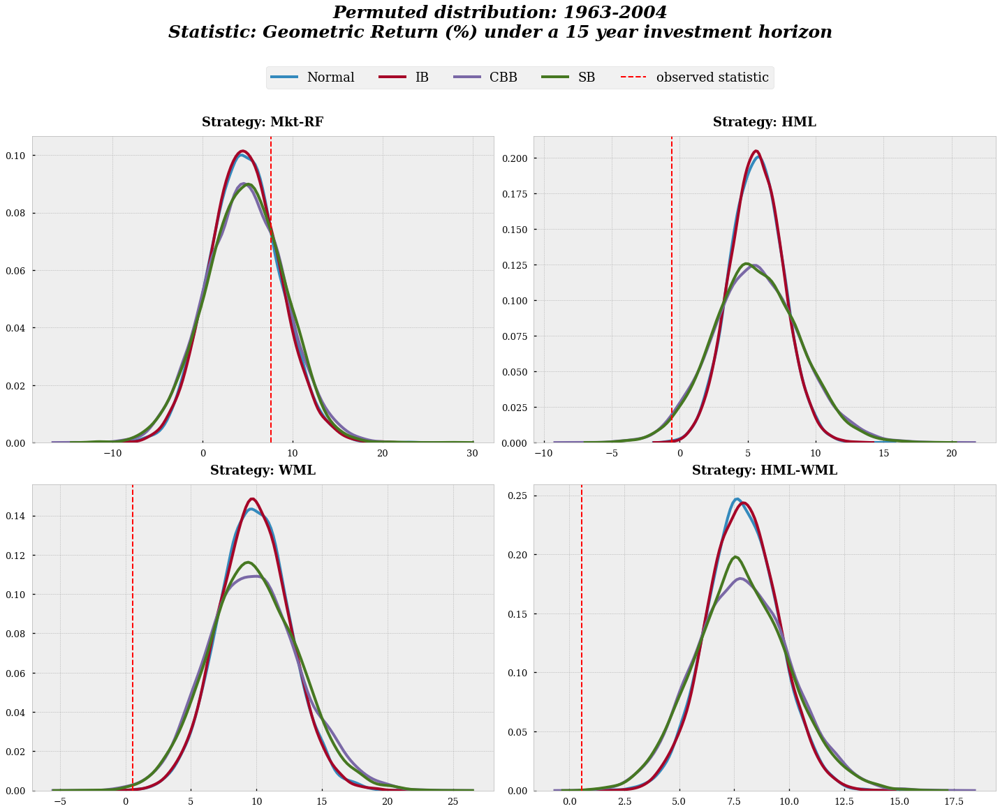

In [78]:
obs_T = perf_stat(df=df_15, stats=["Geometric Return (%)"],dic_perf=perf_stats_dic).values.tolist()[0]
permutation_plot(dic=val_mom_simulation_15_63.store_output,
                 investment_h=15,
                 statistic='Geometric Return (%)',
                 period="1963-2004",
                 obs_stats=obs_T)

### Maximum Drawdown

In [79]:
# observed maximum dd over the last 15 years
perf_stat(df=df_15, stats=["Maximum Drawdown (%)"],dic_perf=perf_stats_dic)

,Mkt-RF,HML,WML,HML-WML
Maximum Drawdown (%),55.813806,32.576258,63.704786,36.19517


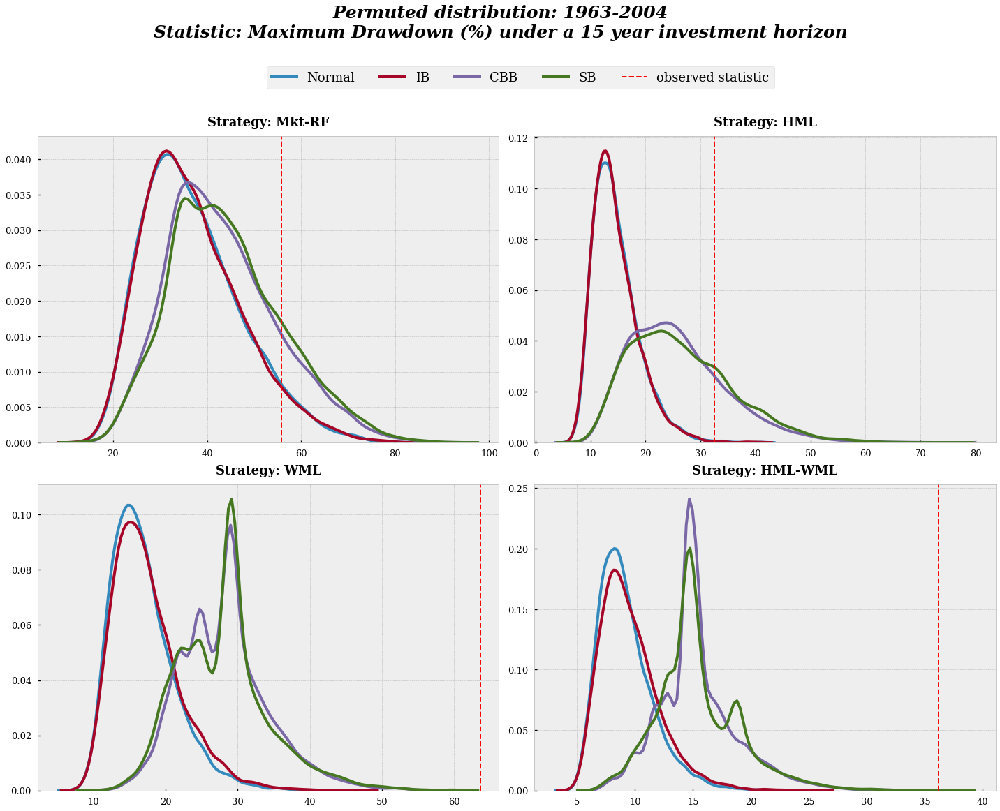

In [80]:
obs_T = perf_stat(df=df_15, stats=["Maximum Drawdown (%)"],dic_perf=perf_stats_dic).values.tolist()[0]
permutation_plot(dic=val_mom_simulation_15_63.store_output,
                 investment_h=15,
                 statistic='Maximum Drawdown (%)',
                 period="1963-2004",
                 obs_stats=obs_T)

### Numeric Summary Table: 01-01-1963 till 31-12-2003

The table below shows the number of returns paths with a more extreme statistic (more to the left except for drawdown this is right). The number of simulations was set at 10,000. 

In [81]:
p_table(stat=sum_stats,
        dic=val_mom_simulation_15_63.store_output,
        observed=df_15, 
        perf_stats_dic=perf_stats_dic)

Performance statistic*     Geometric Return (%) Maximum Drawdown (%)  \
Portfolio Simulatin Method                                             
Mkt-RF    Normal                           7722                  565   
          IB                               7728                  567   
          CBB                              7355                 1487   
          SB                               7379                 1710   
HML       Normal                              6                   22   
          IB                                  4                   18   
          CBB                               225                 2019   
          SB                                203                 2384   
WML       Normal                              1                    0   
          IB                                  3                    0   
          CBB                                31                    0   
          SB                                 27                    0   
HML-WML   Normal                              0                    0   
          IB                                  0                    0   
          CBB                                 1                    1   
          SB                                  0                    2   

Performance statistic*     Geometric SR  
Portfolio Simulatin Method               
Mkt-RF    Normal                   6229  
          IB                       6276  
          CBB                      5960  
          SB                       5893  
HML       Normal                      7  
          IB                          4  
          CBB                       260  
          SB                        245  
WML       Normal                      1  
          IB                          1  
          CBB                        24  
          SB                         20  
HML-WML   Normal                      0  
          IB                          0  
          CBB                         1  
          SB                          0

**Observations regarding the geometric return**

Below I describe my observations for the **annualized geometric return**, similar conclusions hold for other performance statistics (except maybe for maximum drawdown)

The permuted distributions excludes the 15-year period ending 28 February 2019 from the analysis in creating
the 10,000 simulated histories of factor returns. If an investor uses these data to calibrate
expectations about performance over the next 15 years, **how probable would the actual
observed geometric annual returns seem?**

As in chapter 3, I use a blocksize of 126 for the circular block bootstrap and the average blocksize for the stationary bootstrap is also set at 126 days. The p-value associated with the observed  returns are very low except for the market portfolio. Relative to the powerful returns from before 2004, the recent performance of the value, momentum and the value-momentum strategies over the past 15 years is unexpectedly low. There certainly are differences between the different simulation methods, though the main conclusion does not change.

### Simulation Period: 01-01-1927 till 31-12-2003 <a id='4.3.2'></a>

### Geometric return

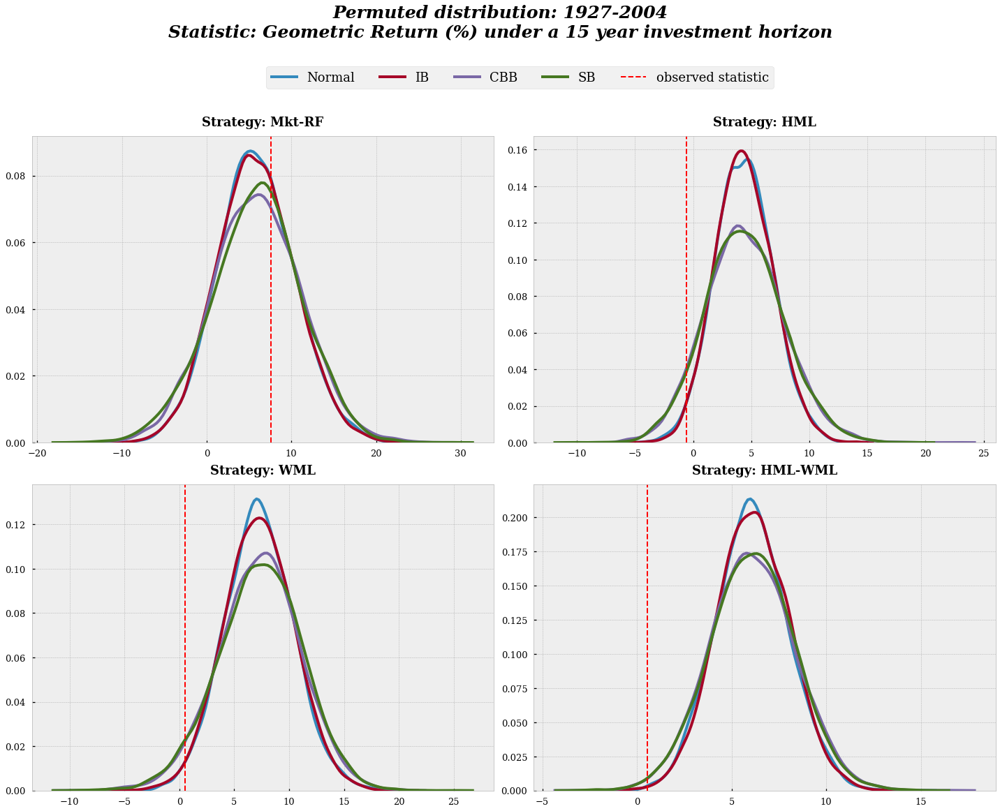

In [82]:
obs_T = perf_stat(df=df_15, stats=["Geometric Return (%)"],dic_perf=perf_stats_dic).values.tolist()[0]
permutation_plot(dic=val_mom_simulation_15_27.store_output,
                 investment_h=15,
                 statistic='Geometric Return (%)',
                 period="1927-2004",
                 obs_stats=obs_T)

### Maximum Drawdown

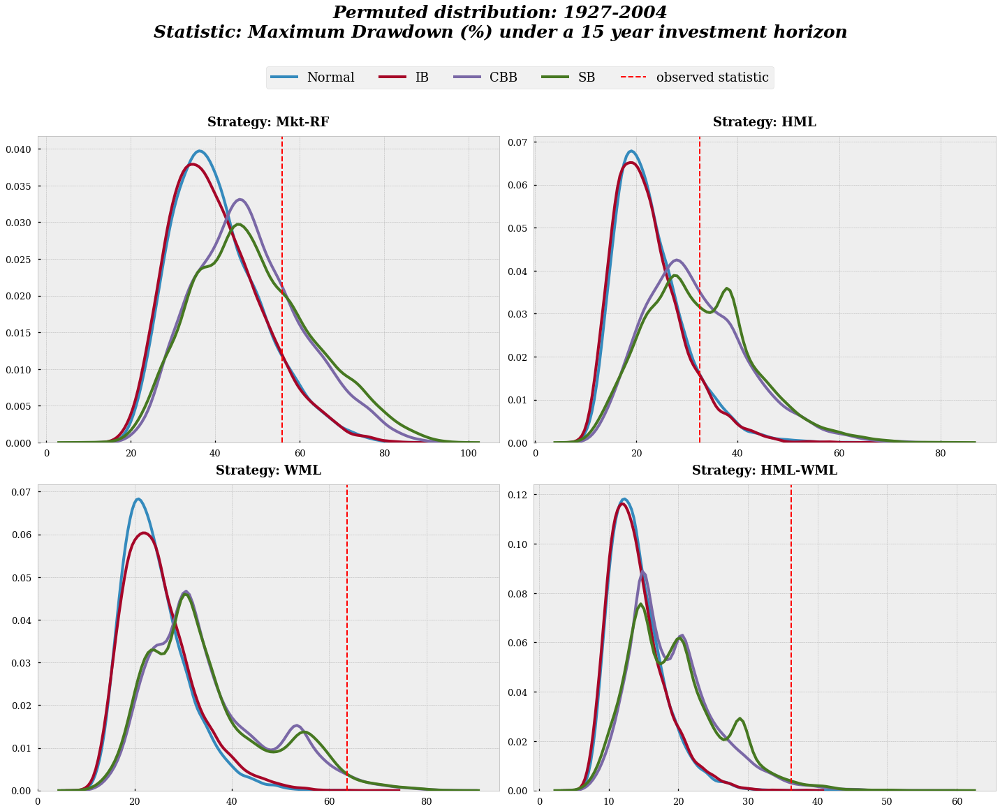

In [83]:
obs_T = perf_stat(df=df_15, stats=["Maximum Drawdown (%)"],dic_perf=perf_stats_dic).values.tolist()[0]
permutation_plot(dic=val_mom_simulation_15_27.store_output,
                 investment_h=15,
                 statistic="Maximum Drawdown (%)",
                 period="1927-2004",
                 obs_stats=obs_T)

### Numeric Summary Table: 01-01-1927 till 31-12-2003

The table below shows the number of returns paths with a more extreme statistic (more to to left except for drawdown this is right). The number of simulations was set at 10,000. 

In [84]:
p_table(stat=sum_stats,
        dic=val_mom_simulation_15_27.store_output,
        observed=df_15,
        perf_stats_dic=perf_stats_dic)

Performance statistic*     Geometric Return (%) Maximum Drawdown (%)  \
Portfolio Simulatin Method                                             
Mkt-RF    Normal                           6500                  948   
          IB                               6530                  928   
          CBB                              6259                 2587   
          SB                               6223                 3051   
HML       Normal                            209                  909   
          IB                                168                  831   
          CBB                               661                 4179   
          SB                                652                 4603   
WML       Normal                            145                    0   
          IB                                161                    2   
          CBB                               413                  221   
          SB                                455                  221   
HML-WML   Normal                             13                    3   
          IB                                 17                    3   
          CBB                                68                  139   
          SB                                 70                  169   

Performance statistic*     Geometric SR  
Portfolio Simulatin Method               
Mkt-RF    Normal                   5873  
          IB                       5885  
          CBB                      5576  
          SB                       5427  
HML       Normal                    219  
          IB                        179  
          CBB                       684  
          SB                        667  
WML       Normal                    130  
          IB                        152  
          CBB                       397  
          SB                        441  
HML-WML   Normal                     15  
          IB                         20  
          CBB                        74  
          SB                         79

**Observations regarding the geometric return**

I repeat the excercise from above, but when constructing the permuted distribution I use all data starting from 01-01-1927 till 31-12-2003. All other parameters are kept the same as before. Looking at the p-values in the table above, the probability of observing the performance for various statisitcs over the last 15 years increases,  but stays rather low. This is certainly the case for the value-momentum strategy.

<a id='Chapter5'></a>
# Chapter 5: Conclusion and discussion


**Investment horizon matters**
 - The probabilities that premiums are negative on a purely chance basis are substantial for the 1-year, 3-year, 5-year and 10-year periods. Chance is big player in outcomes for these horizons.
 - Some differences between the simulation methods, though the main message does not change
 - Deciding on the (mean) block size is not trivial, but there are many reasonable (mean) block sizes that generate realistic price paths, that overall capture the behavior of the original series.
 - Any study such as this suffers from survivor bias: the US stock market was one of the most successful investment choices an investor could have made when looking back. As a result, we are probably underestimating/overestimating depending on the statistic.
 
**Recent past performance of value, momentum and a 50-50 value-momentum strategies are unexpectedly low**

It is no secret that value and momentum strategies have recently fallen far short of investor expectations. Is this a case of the factors being broken or have they just been unlucky over the last 15 years? The answer is probably a combination of both. Recent factor performance has been uncharacteristically bad given pre-2004 performance. Value (HML), momentum (WML) and 50-50 value-momentum (HML-WML) pre-2004 returns were likely inflated due to data mining and selection bias, and their post 2004 returns were likely depressed by crowding  as the factors gained widespread adoption. In contrary, the performance of the market portfolio (Mkt-RF) over the last 15 years is in line with historical expectations.

<a id='Chapter6'></a>
# Chapter 6: Limitations

**Assumptions being made**


- all data over the whole sample is representative: contrary to other people I do think that data from 1927 is still useful. I believe  events like the crash in 1930 can happen again (actually the magnitude of 2007 was close to 1930).
  
- the the sampled blocks are iid
 
- stationarity
 
- there are clear volatility regimes: these have clear impact on our bootstrap results. What are the implications?
 
- drawdown is a question mark for me
 
- survivorship bias: the US stock market was one of the best investment choices an investor could have made. Therefore results in Chapter 3 are probably underestimated (in the negative sense) and are not generalizable to other countries. Furthermore, even in the US, very few investment firms outperform (on various statistics) the portfolios considered in this study (even before slippage and transactions costs).
 
- I do not account for slippage and transaction cost. Slippage is the difference between where the computer signaled the entry and exit for a trade and where actual clients with actual money, entered and exited the market using the computers signals. By definition you would never have had the same price as the historical reported price since you would have moved the price most likely against you. There are however clever ways to minimize this cost. I do not think this is a problem for Chapter 4 as long as you compare apples with apples.

- I assume an investor reinvest his money (no withdrawals), this may not be realistic in reality

- other important assumptions?

<a id='Chapter7'></a>
# Chapter 7: Questions


1. Some general comments on the analysis: 

      - thoughts, suggestions, thing I should pay attention to...


2. Normally when bootstrapping the distribution of the statistic(s) of interest you use all data you have. However, since I am interested in the distribution of the statistic for a specific investment horizon, I condition on the bootstrap length. Is this problematic and what are the consequences? 

3. Regarding maximum drawdown, can I bootstrap such a statistic? I read some arguments about being careful when bootstrapping extrema statistics  **(https://stats.stackexchange.com/questions/119748/using-bootstrap-to-obtain-sampling-distribution-of-1st-percentile), [[6]](http://www.stat.rutgers.edu/home/mxie/stat586/handout/Bootstrap1.pdf)**. For WML and WML-HML, you get a bivariate distribution. I assume this has to do with the volatility regimes?

4. These volatility regimes have a clear impact on our bootstrap results. What are the implications?
5. What are the assumptions being made regarding the block bootstrap (cbb and sb): 
  
    - for example we assume these blocks are iid 
    - how reasonable are these approaches considered for this problem and under what circumstances are they not appropriate? 


6. Regarding the stationary bootstrap: when is this bootstrap method more appropriate compared to the circular block bootstrap?
7. What important assumptions did I made, not mentioned
8. I also looked at the moving block bootstrap, but got very similar result to the circular and stationary block bootstrap. I would like to have a better understanding what assumptions I have made and which bootstraps methods are most appropriate in what circumstances. Regarding the block size, several rules have been suggested when choosing the block the block length. So far I have found several reasonable block sizes that seem to generate realistic price paths, that overall capture the behavior of the original series. Furthermore, the application of stationary bootstrap is less sensitive to the choice of block length compared to the circular block bootstrap.

<a id='Chapter8'></a>
# Chapter 8: References

## Papers
- **[1]  [Arnott, R. D., Harvey, C. R., Kalesnik, V., & Linnainmaa, J. T. (2019). Alice’s Adventures in Factorland: Three Blunders  That Plague Factor Investing. Available at SSRN 3331680.](https://papers.ssrn.com/sol3/papers.cfm?abstract_id=3331680)**
- **[2]  [Fama, E. F., & French, K. R. (2018). Long-horizon returns. The Review of Asset Pricing Studies, 8(2), 232-252.](https://academic.oup.com/raps/article-abstract/8/2/232/4810768)**
- **[3]  [Fama, E. F., & French, K. R. (2012). Size, value, and momentum in international stock returns. Journal of financial economics, 105(3), 457-472.](https://www.sciencedirect.com/science/article/pii/S0304405X12000931)**
- **[4]  [Daniel, K., & Moskowitz, T. J. (2016). Momentum crashes. Journal of Financial Economics, 122(2), 221-247.](https://www.sciencedirect.com/science/article/pii/S0304405X16301490)**
- **[5]  [Radovanov, B., & Marcikić, A. (2014). A comparison of four different block bootstrap methods. Croatian Operational Research Review, 5(2), 189-202.](https://scholar.google.be/scholar?hl=nl&as_sdt=0%2C5&q=Radovanov%2C+B.%2C+%26+Marciki%C4%87%2C+A.+%282014%29.+A+comparison+of+four+different+block+bootstrap+methods.+Croatian+Operational+Research+Review%2C+5%282%29%2C+189-202&btnG=)**

- **[6] [Singh, K., & Xie, M. (2008). Bootstrap: a statistical method. Unpublished manuscript, Rutgers University, USA. Retrieved from http://www. stat. rutgers. edu/home/mxie/RCPapers/bootstrap. pdf.](http://www.stat.rutgers.edu/home/mxie/stat586/handout/Bootstrap1.pdf)**
- **[7] [Efron, B. (1992). Bootstrap methods: another look at the jackknife. In Breakthroughs in statistics (pp. 569-593). Springer, New York, NY.](https://scholar.google.be/scholar?hl=nl&as_sdt=0%2C5&q=Efron%2C+B.+%281979%29.+Bootstrap+methods%3A+Another+look+at+jackknife.+Ann.+Stat.+7%2C+1-26&btnG=)**

## Blogs, websites, presentations ...

- **[8]  http://mba.tuck.dartmouth.edu/pages/faculty/ken.french/data_library.html**
- **[9]  http://keplerianfinance.com/2013/06/the-relevance-of-history/**
- **[10]  https://www.youtube.com/watch?v=27x632vOjXk&t=3349s**
- **[11]  https://www.youtube.com/watch?v=BtiqH_7d2es&t=28s**
- **[12] http://www.blackarbs.com/blog/synthetic-data-generation-part-1-block-bootstrapping**
- **[13] https://arch.readthedocs.io/en/latest/bootstrap/timeseries-bootstraps.html**
- **[14] https://pandas-datareader.readthedocs.io/en/latest/remote_data.html**
- **[15] http://www.ievbras.ru/ecostat/Kiril/R/Biblio_N/R_Eng/Chernick2011.pdf?fbclid=IwAR1f8UAc6s7FAGykclIB0usn0U9RGibNf6sB5ug2z9DEx9DoCK7Q-8nMVLk**
- **[16] http://www.quantdevel.com/public/CSP2015/Talk/BootstrappingTimeSeriesData.pdf?fbclid=IwAR3FiKvHjfrg9zGZkm8aa07vMT15PkpxAYFLqvR50uBdGIjOgM0AY0nsd2U**